# 图像语义分割：从传统方法到深度学习

## 0. 依赖库加载与环境配置

本章节加载所有必要的Python库和配置环境参数。

**主要内容：**
- 导入传统机器学习库（sklearn, skimage等）
- 导入深度学习框架（PyTorch及相关库）
- 配置可视化库（matplotlib, seaborn等）
- 设置随机种子以确保可复现性

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from skimage.segmentation import slic, mark_boundaries
from skimage import color as skcolor, graph
from skimage.color import label2rgb
import seaborn as sns
import maxflow
from glob import glob
import time
import json
from collections import defaultdict

# Deep Learning imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torchvision.transforms.functional as TF
from PIL import Image
from tqdm.notebook import tqdm
import random

# Set random seeds for reproducibility
np.random.seed(5187)
random.seed(5187)
torch.manual_seed(5187)
if torch.cuda.is_available():
    torch.cuda.manual_seed(5187)
# Configure matplotlib
plt.rcParams['figure.figsize'] = (15, 5)
plt.rcParams['font.size'] = 10

print("All libraries loaded successfully\n")
print(f"PyTorch version: {torch.__version__}")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"\nDevice: {device}")

All libraries loaded successfully

PyTorch version: 2.9.0+cu126

Device: cuda


# 1. 数据集加载及探索性数据分析 (EDA)

本章节对MSRC v2数据集进行全面的探索性数据分析。

**主要内容：**
- 加载训练集、验证集和测试集
- 建立颜色到类别的映射关系
- 统计分析数据集特征（图像尺寸、类别分布等）
- 可视化数据样本
- 分析类别不平衡问题

**关键发现：**
MSRC v2数据集包含21个有效类别，其中包含Void区域（标签=255）需要在评估时排除。数据集存在显著的类别不平衡问题，这将影响模型训练和评估。

## 1.1 加载数据集

Train: 276 images, 276 GTs
Validation: 59 images, 59 GTs
Test: 256 images, 256 GTs
Sample path: ./dataset\images\3_11_s.bmp


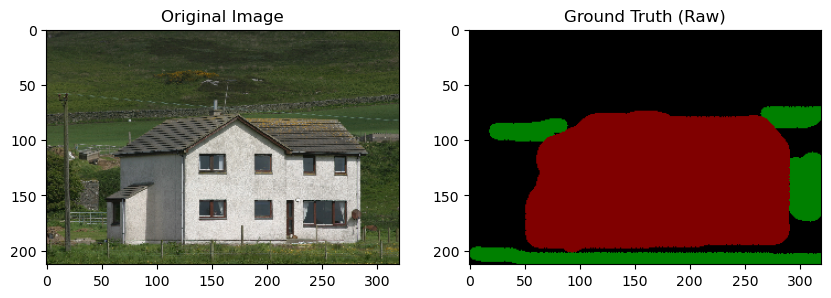

In [2]:
# dataset path
DATASET_ROOT = "./dataset" 
IMAGES_DIR = os.path.join(DATASET_ROOT, "images")
GT_DIR = os.path.join(DATASET_ROOT, "gt")
TRAIN_PATH = os.path.join(DATASET_ROOT, "Train.txt")
VALIDATION_PATH = os.path.join(DATASET_ROOT, "Validation.txt")
TEST_PATH = os.path.join(DATASET_ROOT, "Test.txt")

# load data function
def load_data_paths(txt_file, img_root, gt_root):
    """
    Read the txt file and return full paths for images and GTs
    Automatically handle file name suffixes, adapted for MSRC v2 format (e.g., 'foo' -> 'foo_GT.bmp')
    """
    image_paths = []
    gt_paths = []
    
    # Check if the index file exists
    if not os.path.exists(txt_file):
        print(f"Error: Index file {txt_file} not found")
        return [], []

    with open(txt_file, 'r') as f:
        lines = f.readlines()
        for line in lines:
            filename = line.strip()
            if not filename: continue
            
            # --- Intelligent suffix handling ---
            # Whether the txt contains "1_3_s" or "1_3_s.bmp", we extract the base filename "1_3_s"
            if filename.lower().endswith('.bmp'):
                base_name = filename[:-4]
            elif filename.lower().endswith('.jpg'):
                base_name = filename[:-4]
            else:
                base_name = filename # Assume no suffix

            # --- Construct paths ---
            # Image path (assume all images are .bmp, change to .jpg if not)
            img_p = os.path.join(img_root, base_name + ".bmp")
            
            # GT path (core fix: append _GT.bmp)
            gt_p = os.path.join(gt_root, base_name + "_GT.bmp")
            
            if os.path.exists(img_p) and os.path.exists(gt_p):
                image_paths.append(img_p)
                gt_paths.append(gt_p)
            else:
                # Only print the first missing file for debugging to avoid flooding the output
                if len(image_paths) == 0:
                    print(f"Failed to load: \nImage: {img_p} \nGT: {gt_p}")
                    print("Please check: Does the image really exist? Is the GT filename really _GT.bmp?")
            
    return image_paths, gt_paths




train_img_paths, train_gt_paths = load_data_paths(TRAIN_PATH, IMAGES_DIR, GT_DIR)


val_img_paths, val_gt_paths = load_data_paths(VALIDATION_PATH, IMAGES_DIR, GT_DIR)


test_img_paths, test_gt_paths = load_data_paths(TEST_PATH, IMAGES_DIR, GT_DIR)


print(f"Train: {len(train_img_paths)} images, {len(train_gt_paths)} GTs")
print(f"Validation: {len(val_img_paths)} images, {len(val_gt_paths)} GTs")
print(f"Test: {len(test_img_paths)} images, {len(test_gt_paths)} GTs")

img_num = 15

if len(train_img_paths) > 0:
    print(f"Sample path: {train_img_paths[img_num]}")
    
    # Visualize the first image [cite: 59]
    sample_img = cv2.imread(train_img_paths[img_num])
    sample_gt = cv2.imread(train_gt_paths[img_num])
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1, 2, 2)
    plt.title("Ground Truth (Raw)")
    plt.imshow(cv2.cvtColor(sample_gt, cv2.COLOR_BGR2RGB))
    plt.show()
else:
    print("Warning: No images found, please check if the paths or file extensions are correct.")

## 1.2 建立颜色映射

sample contains 3 unique colors (RGB):
 - [0 0 0]
 - [  0 128   0]
 - [128   0   0]

Starting to build mapping logic


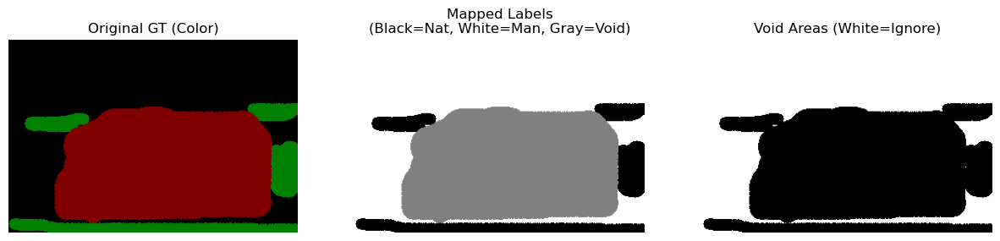

result of mapping:
 - natural pixels (0): 7173
 - man-made pixels (1): 26945
 - ignored pixels (255): 34042


In [3]:
# --- 检查 GT 颜色并建立映射 ---

if len(train_gt_paths) > 0:
    # 读取第一张 GT
    gt_sample = cv2.imread(train_gt_paths[img_num])
    # OpenCV 默认是 BGR，转为 RGB 方便人类阅读
    gt_sample = cv2.cvtColor(gt_sample, cv2.COLOR_BGR2RGB)
    
    # 获取图片中出现的所有唯一颜色值
    unique_colors = np.unique(gt_sample.reshape(-1, gt_sample.shape[2]), axis=0)
    
    print(f"sample contains {len(unique_colors)} unique colors (RGB):")
    for color in unique_colors:
        print(f" - {color}")
        
    print("\nStarting to build mapping logic")
else:
    print("Please resolve data loading issues first.")

# --- Define color mapping dictionary (based on MSRC standard) ---
# Below is the standard definition, you need to fine-tune based on the colors printed above
# Format: (R, G, B) : Class ID (0=Natural, 1=Man-made, 255=Ignore)

def get_msrc_mapping():
    mapping = {}
    
    # ===== 自然 (Natural) -> 0 =====
    mapping[(0, 128, 0)]     = 0  # Grass
    mapping[(0, 192, 0)]     = 0  # Grass Variant
    mapping[(128, 192, 128)] = 0  # Tree/Grass Light
    mapping[(0, 128, 128)]   = 0  # Tree
    mapping[(0, 64, 0)]      = 0  # Mountain
    mapping[(128, 128, 128)] = 0  # Sky
    mapping[(0, 0, 128)]     = 0  # Cow/Water
    mapping[(0, 128, 192)]   = 0  # Water
    
    # 动物修正
    mapping[(128, 128, 0)]   = 0  # Bird
    mapping[(0, 64, 128)]    = 0  # Sheep
    mapping[(64, 0, 128)]    = 0  # Cat
    mapping[(192, 128, 0)]   = 0  # Dog
    mapping[(64, 128, 0)]    = 0  # Horse
    
    # *** 你的侦探发现的新颜色 (关键!!!) ***
    mapping[(192, 64, 0)]    = 0  # 刚才的白色动物!
    mapping[(128, 64, 0)]    = 0  # 另一种动物
    mapping[(0, 192, 128)]   = 0  # 另一种草/动物
    
    mapping[(128, 0, 128)]   = 0  # Face/Person
    mapping[(192, 0, 128)]   = 0  # Flower

    # ===== 人造 (Man-made) -> 1 =====
    mapping[(128, 0, 0)]     = 1  # Building
    mapping[(0, 0, 192)]     = 1  # Airplane
    mapping[(64, 0, 0)]      = 1  # Car
    mapping[(0, 0, 64)]      = 1  # Bicycle
    mapping[(192, 0, 0)]     = 1  # Chair
    mapping[(64, 128, 128)]  = 1  # Sign
    mapping[(128, 64, 128)]  = 1  # Road
    mapping[(192, 128, 128)] = 1  # Sign variant
    mapping[(0, 64, 64)]     = 1  # Boat
    mapping[(0, 128, 64)]    = 1  # Body
    mapping[(192, 192, 128)] = 1  # Book
    
    # *** 你的侦探发现的人造颜色 ***
    mapping[(64, 64, 0)]     = 1  # Car/Chair Variant

    # ===== Void =====
    mapping[(0, 0, 0)]       = 255 

    return mapping

def mask_to_binary(mask_img, mapping):
    """Convert color mask to 0/1/255 matrix"""
    h, w = mask_img.shape[:2]
    # Default fill with Void (255)
    binary_mask = np.full((h, w), 255, dtype=np.uint8)
    
    for rgb_key, label in mapping.items():
        # Find all pixels in the image that match the rgb_key color
        # Note: mask_img must be in RGB format
        matches = np.all(mask_img == np.array(rgb_key), axis=-1)
        binary_mask[matches] = label
        
    return binary_mask

# Test conversion
# 假设 binary_gt 已经生成
if len(train_gt_paths) > 0:
    mapping = get_msrc_mapping()
    binary_gt = mask_to_binary(gt_sample, mapping)
    
    # --- 修正后的可视化代码 ---
    plt.figure(figsize=(15, 5))
    
    # 1. 原图
    plt.subplot(1, 3, 1)
    plt.title("Original GT (Color)")
    plt.imshow(gt_sample)
    plt.axis('off')
    
    # 2. 更好的掩膜显示 (区分三类)
    # 我们创建一个临时的可视化图，把 255 (Void) 变成 2 (灰色)，方便显示
    # 0=Black(Natural), 1=White(Man-made), 2=Gray(Void)
    vis_mask = binary_gt.copy()
    vis_mask[vis_mask == 255] = 2 
    
    plt.subplot(1, 3, 2)
    plt.title("Mapped Labels\n(Black=Nat, White=Man, Gray=Void)")
    # 使用灰度图显示: 0, 1, 2
    plt.imshow(vis_mask, cmap='gray', vmin=0, vmax=2)
    plt.axis('off')
    
    # 3. 验证 Void 区域
    plt.subplot(1, 3, 3)
    plt.title("Void Areas (White=Ignore)")
    plt.imshow(binary_gt == 255, cmap='gray')
    plt.axis('off')
    
    plt.show()
    
    # 打印一下验证数据
    print("result of mapping:")
    print(f" - natural pixels (0): {np.sum(binary_gt == 0)}")
    print(f" - man-made pixels (1): {np.sum(binary_gt == 1)}")
    print(f" - ignored pixels (255): {np.sum(binary_gt == 255)}")

## 1.3 数据集统计分析

In [4]:
import cv2
import numpy as np
from collections import Counter
import os
from tqdm import tqdm
def analyze_dataset(img_paths, gt_paths, dataset_name="Dataset"):
    """
    分析数据集的基本统计信息
    """
    print(f"\n{'='*20} {dataset_name} Statistical Analysis {'='*20}")
    
    # 0. 基础检查
    if len(img_paths) != len(gt_paths):
        print(f"Error: Number of images ({len(img_paths)}) and labels ({len(gt_paths)}) do not match!")
        return None
        
    if len(img_paths) == 0:
        print("Dataset is empty!")
        return None

    # Basic Information
    print(f"\n[Basic Information]")
    print(f"  - Number of images: {len(img_paths)}")
    
    # 1. Image Size Statistics (使用 Counter 优化速度)
    print(f"\n[Image Size Analysis]")
    sizes = []
    
    # 只读取图片头部信息通常更快，但OpenCV必须读取整个文件。
    # 这里为了统计准确性，我们依然读取，但加上进度条。
    print("  Computing image sizes...")
    for img_path in tqdm(img_paths, desc="Reading Images"):
        # 增加文件存在性检查
        if not os.path.exists(img_path):
            print(f"Warning: Image not found at {img_path}")
            continue
            
        img = cv2.imread(img_path)
        if img is not None:
            sizes.append((img.shape[0], img.shape[1])) # (Height, Width)
        else:
            print(f"Warning: Failed to load image {img_path}")
    
    if sizes:
        size_counts = Counter(sizes)
        print(f"  - Found {len(size_counts)} unique image sizes")
        # 按出现频率排序输出前5个，避免太多
        for size, count in size_counts.most_common(5):
            print(f"    Size {size[0]}x{size[1]}: {count} images")
        if len(size_counts) > 5:
            print(f"    ... and {len(size_counts) - 5} others.")
    
    # 2. Class Distribution Statistics
    print(f"\n[Class Distribution Analysis]")
    mapping = get_msrc_mapping()
    
    natural_pixels_total = 0
    manmade_pixels_total = 0
    void_pixels_total = 0
    total_pixels = 0
    
    natural_dominant_count = 0
    manmade_dominant_count = 0
    balanced_count = 0
    
    # 使用 tqdm 显示进度
    for i in tqdm(range(len(img_paths)), desc="Analyzing Masks"):
        if not os.path.exists(gt_paths[i]):
            continue
            
        gt_img = cv2.imread(gt_paths[i])
        if gt_img is None:
            continue
            
        gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
        
        # 调用外部函数处理掩码
        try:
            gt_mask = mask_to_binary(gt_img, mapping)
        except Exception as e:
            print(f"Error processing mask {gt_paths[i]}: {e}")
            continue
        
        nat = np.sum(gt_mask == 0)
        man = np.sum(gt_mask == 1)
        void = np.sum(gt_mask == 255)
        
        natural_pixels_total += nat
        manmade_pixels_total += man
        void_pixels_total += void
        total_pixels += gt_mask.size
        
        # 判断图像主导类别
        valid_pixels = nat + man
        if valid_pixels > 0:
            nat_ratio = nat / valid_pixels
            if nat_ratio > 0.7:
                natural_dominant_count += 1
            elif nat_ratio < 0.3: # 即 man_ratio > 0.7
                manmade_dominant_count += 1
            else:
                balanced_count += 1
        else:
            # 如果全是 void 像素，可以根据需求处理，这里暂时不计入分类统计
            pass
    
    # 3. 输出统计结果
    if total_pixels > 0:
        nat_pct = natural_pixels_total / total_pixels * 100
        man_pct = manmade_pixels_total / total_pixels * 100
        void_pct = void_pixels_total / total_pixels * 100
        
        print(f"\n  Pixel-wise Statistics:")
        print(f"  - Natural:   {natural_pixels_total:,} pixels ({nat_pct:.2f}%)")
        print(f"  - Man-made:  {manmade_pixels_total:,} pixels ({man_pct:.2f}%)")
        print(f"  - Void:      {void_pixels_total:,} pixels ({void_pct:.2f}%)")
        
        print(f"\n  Image-level Dominance:")
        sample_size = len(img_paths) # 使用实际图片数量作为分母
        print(f"  - Natural Dominant (>70% natural):   {natural_dominant_count} images ({natural_dominant_count/sample_size*100:.1f}%)")
        print(f"  - Man-made Dominant (>70% man-made): {manmade_dominant_count} images ({manmade_dominant_count/sample_size*100:.1f}%)")
        print(f"  - Balanced Images (30%-70%):         {balanced_count} images ({balanced_count/sample_size*100:.1f}%)")
    
    return {
        'natural_pixels': natural_pixels_total,
        'manmade_pixels': manmade_pixels_total,
        'void_pixels': void_pixels_total,
        'natural_dominant': natural_dominant_count,
        'manmade_dominant': manmade_dominant_count,
        'balanced': balanced_count
    }

# 示例调用 (确保路径变量已定义)
train_stats = analyze_dataset(train_img_paths, train_gt_paths, "Training Set")
val_stats = analyze_dataset(val_img_paths, val_gt_paths, "Validation Set")
test_stats = analyze_dataset(test_img_paths, test_gt_paths, "Test Set")


==================== Training Set Statistical Analysis ====================

[Basic Information]
  - Number of images: 276

[Image Size Analysis]
  Computing image sizes...


Reading Images: 100%|██████████| 276/276 [00:00<00:00, 2301.04it/s]


  - Found 5 unique image sizes
    Size 213x320: 206 images
    Size 240x320: 34 images
    Size 320x213: 20 images
    Size 320x240: 15 images
    Size 235x320: 1 images

[Class Distribution Analysis]


Analyzing Masks: 100%|██████████| 276/276 [00:08<00:00, 31.92it/s]



  Pixel-wise Statistics:
  - Natural:   9,683,067 pixels (50.32%)
  - Man-made:  4,011,875 pixels (20.85%)
  - Void:      5,547,618 pixels (28.83%)

  Image-level Dominance:
  - Natural Dominant (>70% natural):   158 images (57.2%)
  - Man-made Dominant (>70% man-made): 53 images (19.2%)
  - Balanced Images (30%-70%):         65 images (23.6%)

==================== Validation Set Statistical Analysis ====================

[Basic Information]
  - Number of images: 59

[Image Size Analysis]
  Computing image sizes...


Reading Images: 100%|██████████| 59/59 [00:00<00:00, 2484.93it/s]


  - Found 4 unique image sizes
    Size 213x320: 41 images
    Size 240x320: 10 images
    Size 320x213: 6 images
    Size 320x240: 2 images

[Class Distribution Analysis]


Analyzing Masks: 100%|██████████| 59/59 [00:01<00:00, 32.16it/s]



  Pixel-wise Statistics:
  - Natural:   2,157,059 pixels (52.29%)
  - Man-made:  922,256 pixels (22.36%)
  - Void:      1,045,805 pixels (25.35%)

  Image-level Dominance:
  - Natural Dominant (>70% natural):   32 images (54.2%)
  - Man-made Dominant (>70% man-made): 10 images (16.9%)
  - Balanced Images (30%-70%):         17 images (28.8%)

==================== Test Set Statistical Analysis ====================

[Basic Information]
  - Number of images: 256

[Image Size Analysis]
  Computing image sizes...


Reading Images: 100%|██████████| 256/256 [00:00<00:00, 2721.35it/s]


  - Found 6 unique image sizes
    Size 213x320: 196 images
    Size 240x320: 33 images
    Size 320x213: 15 images
    Size 320x240: 9 images
    Size 239x320: 2 images
    ... and 1 others.

[Class Distribution Analysis]


Analyzing Masks: 100%|██████████| 256/256 [00:08<00:00, 31.95it/s]


  Pixel-wise Statistics:
  - Natural:   9,293,616 pixels (52.18%)
  - Man-made:  3,760,914 pixels (21.11%)
  - Void:      4,757,630 pixels (26.71%)

  Image-level Dominance:
  - Natural Dominant (>70% natural):   148 images (57.8%)
  - Man-made Dominant (>70% man-made): 39 images (15.2%)
  - Balanced Images (30%-70%):         69 images (27.0%)


## 1.4 可视化样本展示

Draw random samples for visualization
Training Set Samples Samples Visualization


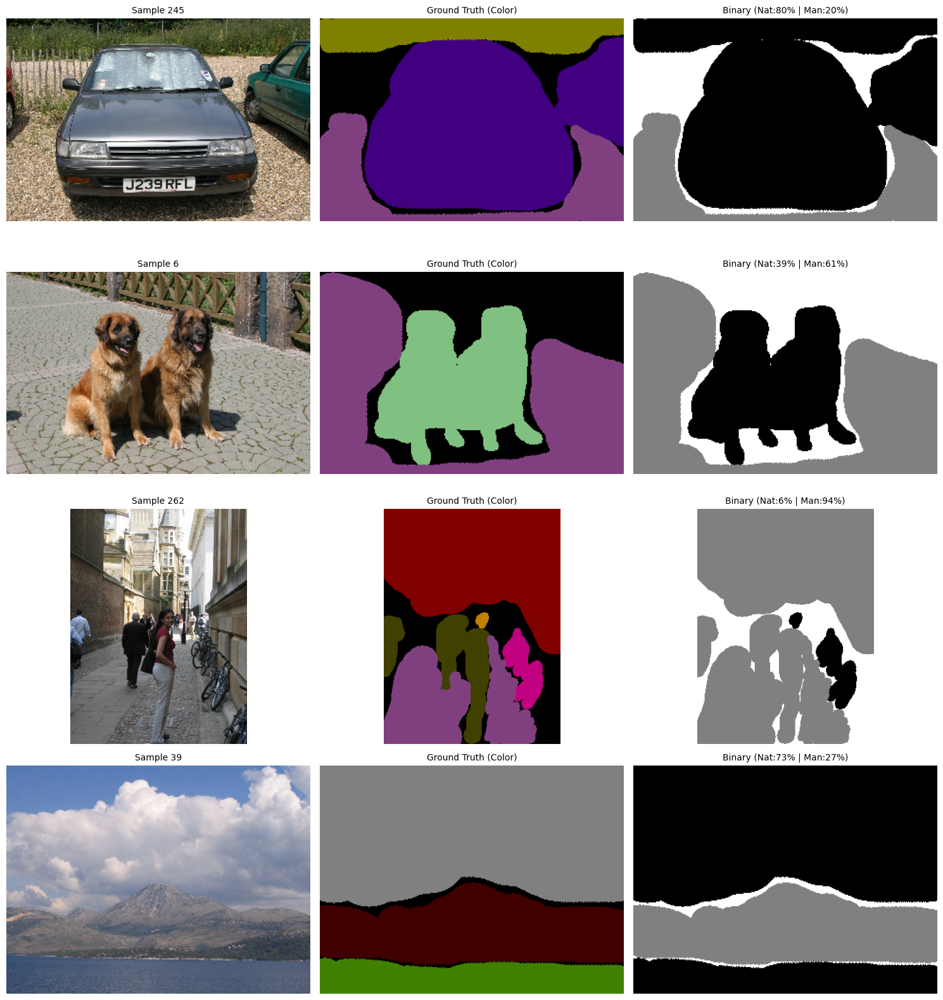

Validation Set Samples Samples Visualization


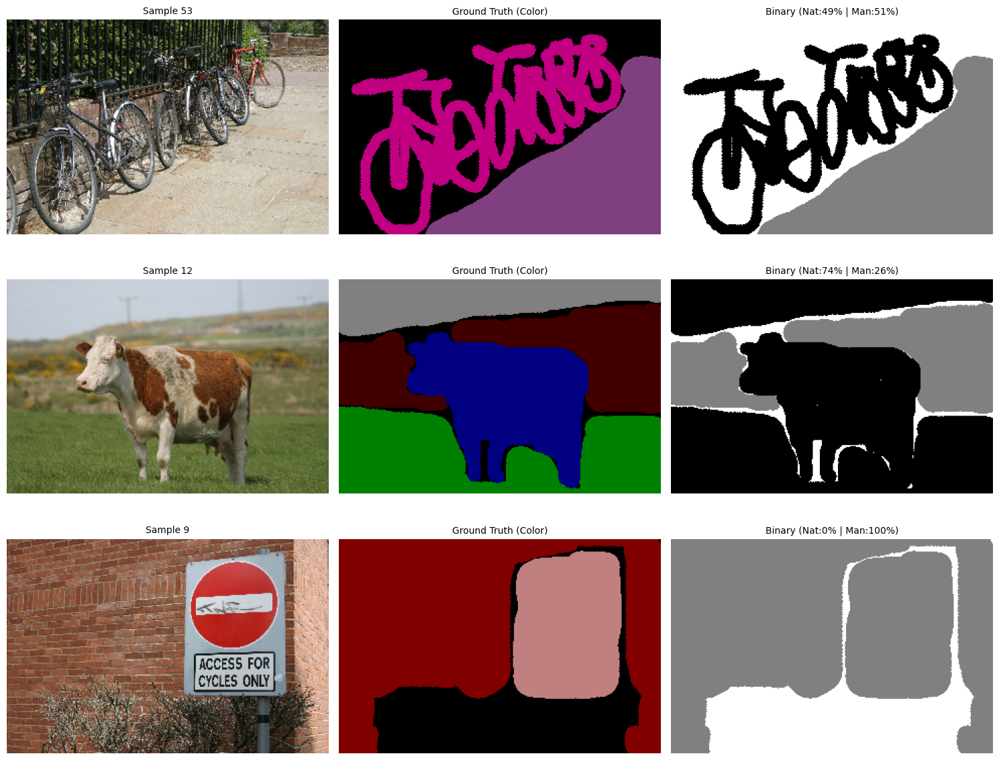

Test Set Samples Samples Visualization


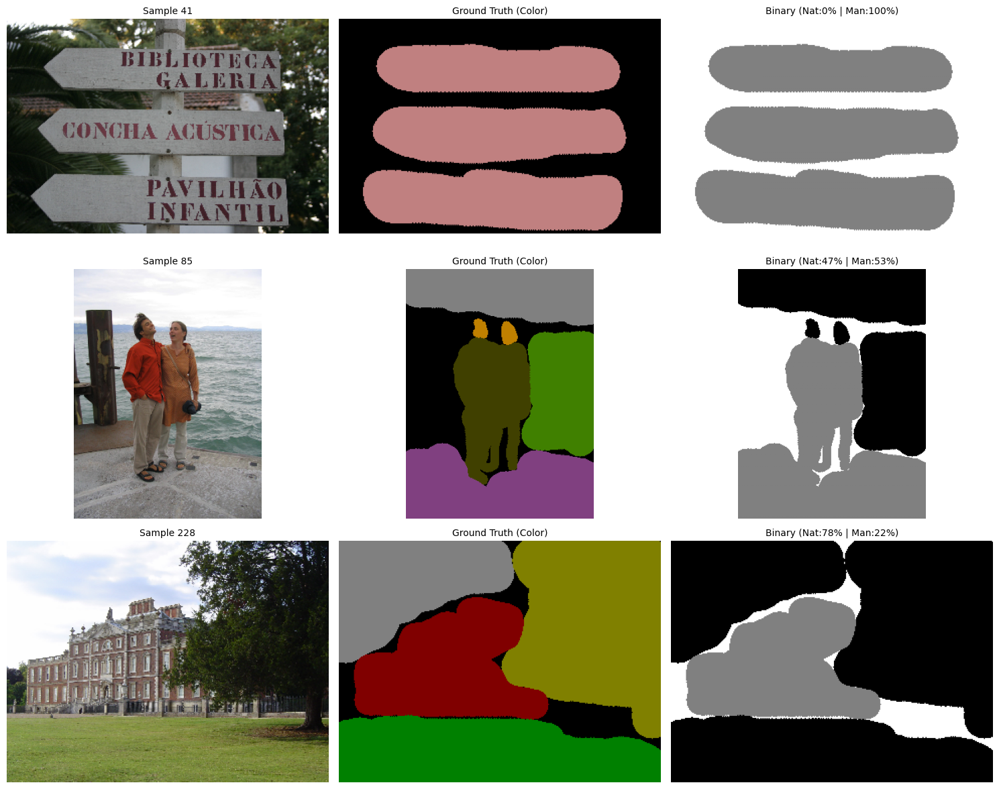

In [5]:
def visualize_samples(img_paths, gt_paths, dataset_name="Dataset", num_samples=6):
    """
    可视化数据集中的随机样本
    """
    print(f"{dataset_name} Samples Visualization")
    
    if len(img_paths) == 0:
        print("Dataset is empty, cannot visualize samples")
        return
    
    # 随机选择样本
    indices = np.random.choice(len(img_paths), min(num_samples, len(img_paths)), replace=False)
    
    mapping = get_msrc_mapping()
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 4))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for idx, sample_idx in enumerate(indices):
        # 读取图像
        img = cv2.imread(img_paths[sample_idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # 读取GT
        gt_img = cv2.imread(gt_paths[sample_idx])
        gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
        gt_mask = mask_to_binary(gt_img, mapping)
        
        # 计算统计信息
        nat = np.sum(gt_mask == 0)
        man = np.sum(gt_mask == 1)
        void = np.sum(gt_mask == 255)
        valid = nat + man
        
        # 原图
        axes[idx, 0].imshow(img)
        axes[idx, 0].set_title(f"Sample {sample_idx}", fontsize=10)
        axes[idx, 0].axis('off')
        
        # GT (彩色)
        axes[idx, 1].imshow(gt_img)
        axes[idx, 1].set_title("Ground Truth (Color)", fontsize=10)
        axes[idx, 1].axis('off')
        
        # GT (二值化)
        vis_mask = gt_mask.copy()
        vis_mask[vis_mask == 255] = 2
        axes[idx, 2].imshow(vis_mask, cmap='gray', vmin=0, vmax=2)
        if valid > 0:
            nat_pct = nat / valid * 100
            man_pct = man / valid * 100
            axes[idx, 2].set_title(f"Binary (Nat:{nat_pct:.0f}% | Man:{man_pct:.0f}%)", fontsize=10)
        else:
            axes[idx, 2].set_title("Binary (All Void)", fontsize=10)
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# 可视化各数据集样本
print("Draw random samples for visualization")
visualize_samples(train_img_paths, train_gt_paths, "Training Set Samples", num_samples=4)
visualize_samples(val_img_paths, val_gt_paths, "Validation Set Samples", num_samples=3)
visualize_samples(test_img_paths, test_gt_paths, "Test Set Samples", num_samples=3)

## 1.5 类别分布可视化


Dataset distribution visualization



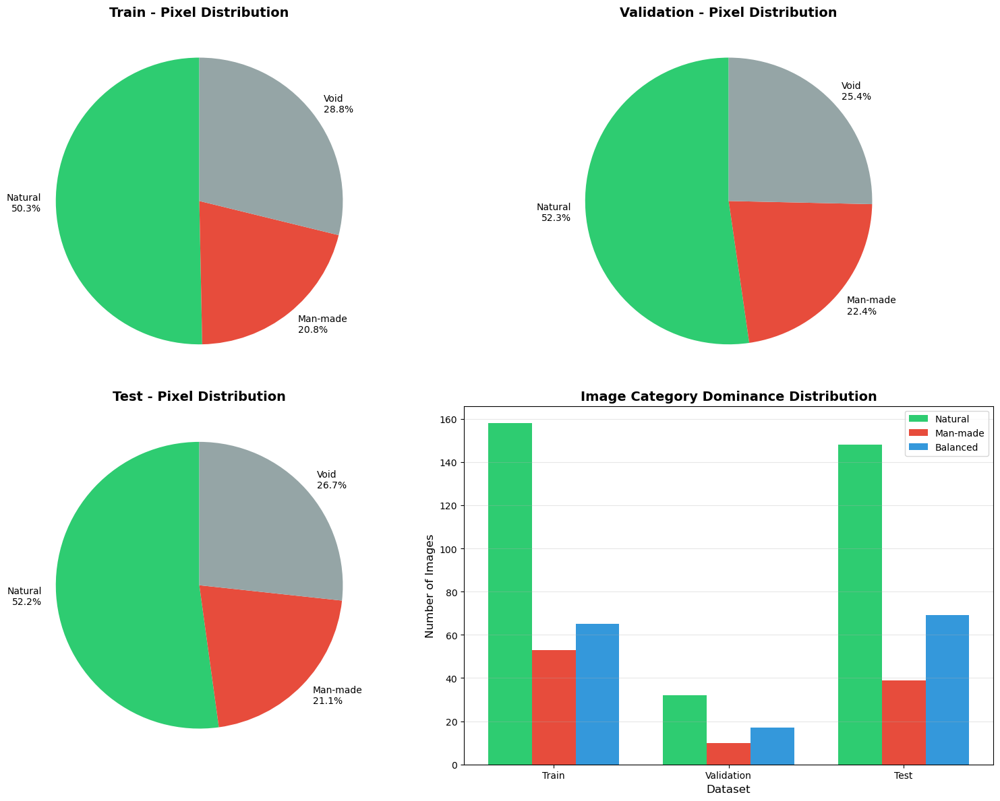


Overall Statistics Summary:
Dataset         Number of Images Natural Pixels  Man-made Pixels Void Pixels    
Train           276             9,683,067      4,011,875      5,547,618
Validation      59              2,157,059        922,256      1,045,805
Test            256             9,293,616      3,760,914      4,757,630
Total           591            21,133,742      8,695,045     11,351,053

Overall Valid Pixel Distribution:
   Natural:  70.85%
   Man-made: 29.15%
   Category Balance: 41.14%


In [6]:
def plot_dataset_distribution(train_stats, val_stats, test_stats):
    """
    绘制数据集的类别分布图表
    """
    print("\nDataset distribution visualization\n")
    
    # 创建图表
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. 像素级别分布 (饼图)
    datasets = ['Train', 'Validation', 'Test']
    stats_list = [train_stats, val_stats, test_stats]
    
    for idx, (dataset, stats) in enumerate(zip(datasets, stats_list)):
        ax = axes[0, idx] if idx < 2 else axes[1, 0]
        
        nat = stats['natural_pixels']
        man = stats['manmade_pixels']
        void = stats['void_pixels']
        total = nat + man + void
        
        if total > 0:
            sizes = [nat, man, void]
            labels = [f'Natural\n{nat/total*100:.1f}%', 
                     f'Man-made\n{man/total*100:.1f}%', 
                     f'Void\n{void/total*100:.1f}%']
            colors = ['#2ecc71', '#e74c3c', '#95a5a6']
            
            ax.pie(sizes, labels=labels, colors=colors, autopct='', startangle=90)
            ax.set_title(f'{dataset} - Pixel Distribution', fontsize=14, fontweight='bold')
    
    # 2. 图像类别主导性分布 (柱状图)
    ax = axes[1, 1]
    
    x = np.arange(len(datasets))
    width = 0.25
    
    nat_dominant = [s['natural_dominant'] for s in stats_list]
    man_dominant = [s['manmade_dominant'] for s in stats_list]
    balanced = [s['balanced'] for s in stats_list]
    
    ax.bar(x - width, nat_dominant, width, label='Natural', color='#2ecc71')
    ax.bar(x, man_dominant, width, label='Man-made', color='#e74c3c')
    ax.bar(x + width, balanced, width, label='Balanced', color='#3498db')
    
    ax.set_xlabel('Dataset', fontsize=12)
    ax.set_ylabel('Number of Images', fontsize=12)
    ax.set_title('Image Category Dominance Distribution', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(datasets)
    ax.legend()
    ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # 3. Overall Statistics Table
    print("\nOverall Statistics Summary:")
    print(f"{'Dataset':<15} {'Number of Images':<15} {'Natural Pixels':<15} {'Man-made Pixels':<15} {'Void Pixels':<15}")
    
    total_images = len(train_img_paths) + len(val_img_paths) + len(test_img_paths)
    total_nat = sum(s['natural_pixels'] for s in stats_list)
    total_man = sum(s['manmade_pixels'] for s in stats_list)
    total_void = sum(s['void_pixels'] for s in stats_list)
    
    for dataset, img_paths, stats in zip(['Train', 'Validation', 'Test'], 
                                          [train_img_paths, val_img_paths, test_img_paths],
                                          stats_list):
        print(f"{dataset:<15} {len(img_paths):<10} {stats['natural_pixels']:>14,} {stats['manmade_pixels']:>14,} {stats['void_pixels']:>14,}")
    

    print(f"{'Total':<15} {total_images:<10} {total_nat:>14,} {total_man:>14,} {total_void:>14,}")
 

    # 4. Proportion Information
    total_valid = total_nat + total_man
    if total_valid > 0:
        print(f"\nOverall Valid Pixel Distribution:")
        print(f"   Natural:  {total_nat/total_valid*100:.2f}%")
        print(f"   Man-made: {total_man/total_valid*100:.2f}%")
        print(f"   Category Balance: {min(total_nat, total_man) / max(total_nat, total_man) * 100:.2f}%")

# 绘制分布图
plot_dataset_distribution(train_stats, val_stats, test_stats)

# 2. 传统方法：基于超像素与MRF的图像分割

## 2.1 一元势能：基于超像素的特征提取与分类

### 2.1.1 超像素分割

In [8]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from skimage.segmentation import slic, mark_boundaries
from skimage import color as skcolor
from skimage.color import label2rgb
import time

# =====================================================
# 辅助函数：自适应超像素分割
# =====================================================
def generate_superpixels_adaptive(image_source, target_density=0.006):
    """
    自适应超像素分割 - 根据图像尺寸动态调整超像素数量

    参数:
        image_source: 图像路径(字符串)或已经加载的RGB图像(numpy array)
        target_density: 目标密度 (超像素数/像素数), 默认0.006 即每167个像素一个超像素

    返回:
        image: RGB图像
        segments: 超像素标签矩阵
    """
    if isinstance(image_source, str):
        image = cv2.imread(image_source)
        if image is None:
            raise FileNotFoundError(f"Unable to read image: {image_source}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    elif isinstance(image_source, np.ndarray):
        image = image_source
    else:
        raise ValueError("image_source Must be a file path or RGB numpy array")

    h, w = image.shape[:2]
    n_pixels = h * w
    n_segments = int(n_pixels * target_density)
    n_segments = max(100, min(n_segments, 900))  # 略微放宽上限，捕获更多细节

    segments = slic(image, n_segments=n_segments, compactness=10, sigma=1, start_label=0)
    return image, segments

# =====================================================
# 特征提取（增强版 - 16维特征）
# =====================================================
def extract_features_and_labels(image, segments, gt_mask=None):
    """
    从超像素中提取特征
    特征维度: [LAB均值3, LAB Std 3, HSV均值3, Grad均值/Std, Edge密度, 超像素面积占比, Y/X位置, LAB全局对比度]
    """
    image_lab = skcolor.rgb2lab(image)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    grad_x = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)
    grad_mag = cv2.magnitude(grad_x, grad_y)
    grad_mag_norm = grad_mag / (np.max(grad_mag) + 1e-6)
    edges = cv2.Canny(gray, 60, 150)

    total_pixels = image.shape[0] * image.shape[1]
    global_lab_mean = np.mean(image_lab.reshape(-1, 3), axis=0)
    superpixel_ids = np.unique(segments)

    features = []
    labels = []

    for sp_id in superpixel_ids:
        mask = (segments == sp_id)
        if mask.sum() == 0:
            continue

        lab_pixels = image_lab[mask]
        hsv_pixels = image_hsv[mask]
        grad_pixels = grad_mag_norm[mask]
        edge_pixels = edges[mask]

        # 颜色特征 (LAB空间)
        lab_mean = np.mean(lab_pixels, axis=0)
        lab_std = np.std(lab_pixels, axis=0)

        # HSV均值 (对饱和度/亮度更敏感)
        hsv_mean = np.mean(hsv_pixels, axis=0)

        # 纹理/边缘特征
        grad_mean = np.mean(grad_pixels)
        grad_std = np.std(grad_pixels)
        edge_density = np.mean(edge_pixels > 0)

        # 位置 & 形状特征
        area_ratio = mask.sum() / total_pixels
        y_coords, x_coords = np.where(mask)
        y_center = np.mean(y_coords) / image.shape[0]
        x_center = np.mean(x_coords) / image.shape[1]

        # 与整图颜色对比
        color_contrast = np.linalg.norm(lab_mean - global_lab_mean)

        feat_vector = np.concatenate([
            lab_mean,
            lab_std,
            hsv_mean,
            [grad_mean, grad_std, edge_density, area_ratio, y_center, x_center, color_contrast]
        ])
        features.append(feat_vector)

        if gt_mask is not None:
            gt_pixels = gt_mask[mask]
            counts = np.bincount(gt_pixels.astype(int), minlength=256)
            count_0 = counts[0]
            count_1 = counts[1]
            count_void = counts[255]

            if count_void > (count_0 + count_1):
                label = 255  # Void
            else:
                label = 0 if count_0 > count_1 else 1
            labels.append(label)

    return np.array(features), np.array(labels)

# =====================================================
# 批量构建数据集
# =====================================================
def build_dataset(img_paths, gt_paths, target_density=0.006):
    """
    遍历所有图片，提取特征和标签
    自动适配不同尺寸的图片
    """
    all_features = []
    all_labels = []

    print(f"Starting to process {len(img_paths)} images")
    start_time = time.time()

    # 修改处：使用 tqdm 包装 zip，并移除原本的 i 变量和手动 print
    # total=len(img_paths) 确保进度条知道总长度
    # desc="Building Dataset" 设置进度条左侧的描述文字
    for img_p, gt_p in tqdm(zip(img_paths, gt_paths), total=len(img_paths), desc="Building Dataset"):
        img_bgr = cv2.imread(img_p)
        if img_bgr is None:
            continue
        img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        gt_img = cv2.imread(gt_p)
        if gt_img is None:
            continue
        gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
        mapping = get_msrc_mapping()
        gt_mask = mask_to_binary(gt_img, mapping)

        # 自适应超像素分割 (直接复用已加载的RGB图像，避免重复IO)
        _, segments = generate_superpixels_adaptive(img, target_density)

        feats, labs = extract_features_and_labels(img, segments, gt_mask)

        all_features.append(feats)
        all_labels.append(labs)

        # 已移除原本的 if (i + 1) % 50 == 0 打印逻辑

    if not all_features:
        raise RuntimeError("Failed to build any features, please check the data path")

    X = np.concatenate(all_features, axis=0)
    y = np.concatenate(all_labels, axis=0)

    elapsed = time.time() - start_time
    print(f"Dataset construction completed! Time elapsed: {elapsed:.2f} seconds")
    print(f"Total features: {len(X)}, Feature dimension: {X.shape[1]}")

    return X, y


# 构建训练数据集
print("\nBuild dataset")
X_raw, y_raw = build_dataset(train_img_paths, train_gt_paths)

# 过滤Void标签
valid_mask = (y_raw != 255)
X_train = X_raw[valid_mask]
y_train = y_raw[valid_mask]

print(f"\n   Valid training samples: {len(X_train)}")
print(f"   - Natural: {np.sum(y_train == 0)}")
print(f"   - Man-made: {np.sum(y_train == 1)}")

X_val_raw, y_val_raw = build_dataset(val_img_paths, val_gt_paths)
    
# 过滤 Void (255) 标签
val_mask = (y_val_raw != 255)
X_val = X_val_raw[val_mask]
y_val = y_val_raw[val_mask]

print(f"\n   Valid validation samples: {len(X_val)}")
print(f"   - Natural: {np.sum(y_val == 0)}")
print(f"   - Man-made: {np.sum(y_val == 1)}")

X_test_raw, y_test_raw = build_dataset(test_img_paths, test_gt_paths)
    
# 过滤 Void (255) 标签
test_mask = (y_test_raw != 255)
X_test = X_test_raw[test_mask]
y_test = y_test_raw[test_mask]

print(f"\n   Valid test samples: {len(X_test)}")
print(f"   - Natural: {np.sum(y_test == 0)}")
print(f"   - Man-made: {np.sum(y_test == 1)}")


Build dataset
Starting to process 276 images


Building Dataset: 100%|██████████| 276/276 [01:12<00:00,  3.82it/s]


Dataset construction completed! Time elapsed: 72.19 seconds
Total features: 99990, Feature dimension: 16

   Valid training samples: 71671
   - Natural: 51422
   - Man-made: 20249
Starting to process 59 images


Building Dataset: 100%|██████████| 59/59 [00:15<00:00,  3.89it/s]


Dataset construction completed! Time elapsed: 15.17 seconds
Total features: 21553, Feature dimension: 16

   Valid validation samples: 16254
   - Natural: 11568
   - Man-made: 4686
Starting to process 256 images


Building Dataset: 100%|██████████| 256/256 [01:04<00:00,  3.94it/s]

Dataset construction completed! Time elapsed: 64.98 seconds
Total features: 92140, Feature dimension: 16

   Valid test samples: 67815
   - Natural: 49124
   - Man-made: 18691


### 2.1.2 Random Forest

In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
# 移除了 tqdm 导入

# =====================================================
# 1. 训练 Random Forest
# =====================================================
print("\nTrain Random Forest...")

rf_clf = RandomForestClassifier(
    n_estimators=1000,           # 直接设置总树数
    max_depth=None,
    min_samples_leaf=8,
    max_features='sqrt',
    class_weight='balanced_subsample',
    n_jobs=-1,
    random_state=5187,
    oob_score=True
)

# 直接进行一次性训练
rf_clf.fit(X_train, y_train)

# 训练集评估
train_acc = rf_clf.score(X_train, y_train)
print(f"   Training accuracy: {train_acc*100:.2f}%")
if hasattr(rf_clf, "oob_score_"):
    print(f"   OOB estimated accuracy: {rf_clf.oob_score_*100:.2f}%")

# =====================================================
# 2. 特征重要性分析
# =====================================================
feature_names = [
    'L_mean', 'A_mean', 'B_mean',
    'Std_L', 'Std_A', 'Std_B',
    'H_mean', 'S_mean', 'V_mean',
    'Grad_mean', 'Grad_std',
    'Edge_density', 'Area_ratio',
    'Y_center', 'X_center',
    'Lab_contrast'
]

importances = rf_clf.feature_importances_
print(f"\n   Feature Importance Top-10:")
for name, imp in sorted(zip(feature_names, importances), key=lambda x: x[1], reverse=True)[:10]:
    print(f"      {name}: {imp:.4f}")

print("\nRandom Forest training completed!")

# =====================================================
# 3. 在验证集上评估
# =====================================================
print(f"\n{'='*20} Validation Phase {'='*20}")

# 构建验证集特征
print("Building Validation Dataset...")
# 预测
print("Predicting on validation set...")
y_val_pred = rf_clf.predict(X_val)

# 计算指标
val_acc = accuracy_score(y_val, y_val_pred)
print(f"\n>>> Validation Accuracy: {val_acc*100:.2f}%")

print("\nDetailed Classification Report:")
print(classification_report(y_val, y_val_pred, target_names=['Natural', 'Man-made']))

print("\nConfusion Matrix:")
cm = confusion_matrix(y_val, y_val_pred)
print(f"             Predicted Natural  Predicted Man-made")
print(f"True Natural      {cm[0][0]:<15}    {cm[0][1]}")
print(f"True Man-made     {cm[1][0]:<15}    {cm[1][1]}")


Train Random Forest...
   Training accuracy: 96.06%
   OOB estimated accuracy: 89.53%

   Feature Importance Top-10:
      A_mean: 0.1957
      H_mean: 0.1041
      B_mean: 0.1037
      S_mean: 0.0953
      Grad_std: 0.0599
      Y_center: 0.0594
      Grad_mean: 0.0556
      Lab_contrast: 0.0555
      V_mean: 0.0443
      L_mean: 0.0435

Random Forest training completed!

==================== Validation Phase ====================
Building Validation Dataset...
Predicting on validation set...

>>> Validation Accuracy: 82.16%

Detailed Classification Report:
              precision    recall  f1-score   support

     Natural       0.87      0.88      0.88     11568
    Man-made       0.70      0.67      0.69      4686

    accuracy                           0.82     16254
   macro avg       0.78      0.78      0.78     16254
weighted avg       0.82      0.82      0.82     16254


Confusion Matrix:
             Predicted Natural  Predicted Man-made
True Natural      10201              1

### 2.1.3 GMM

In [11]:
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np

print(f"\n{'='*20} GMM Classifier Training {'='*20}")

# =====================================================
# 1. 数据准备与标准化
# =====================================================
# GMM 对数据的尺度非常敏感，必须进行标准化 (StandardScaler)
print("Feature normalization...")
scaler_gmm = StandardScaler()
# 注意：必须只在训练集上 fit，测试集上只能 transform
X_train_scaled_gmm = scaler_gmm.fit_transform(X_train)

# 分离两个类别的数据
X_natural = X_train_scaled_gmm[y_train == 0]
X_manmade = X_train_scaled_gmm[y_train == 1]

print(f"   Natural samples: {len(X_natural)}")
print(f"   Man-made samples: {len(X_manmade)}")

# =====================================================
# 2. 训练两个独立的 GMM 模型
# =====================================================
print("\nTraining GMM models...")

# 训练 Natural 类的 GMM
print("   - Natural GMM (15 components)")
gmm_nat = GaussianMixture(
    n_components=15,
    covariance_type='full',
    random_state=5187,
    max_iter=100,
    n_init=5  # 为了速度设为1，如果结果不好可以设为3或5
)
gmm_nat.fit(X_natural)

# 训练 Man-made 类的 GMM
print("   - Man-made GMM (15 components)")
gmm_man = GaussianMixture(
    n_components=15,
    covariance_type='full',
    random_state=5187,
    max_iter=100,
    n_init=5
)
gmm_man.fit(X_manmade)

# =====================================================
# 3. 封装分类器类
# =====================================================
class GMMClassifier:
    def __init__(self, gmm_nat, gmm_man, scaler):
        self.gmm_nat = gmm_nat
        self.gmm_man = gmm_man
        self.scaler = scaler
    
    def predict(self, X):
        # 1. 先标准化数据 (使用训练好的 scaler)
        X_scaled = self.scaler.transform(X)
        
        # 2. 计算对数似然度 (Log Likelihood)
        score_nat = self.gmm_nat.score_samples(X_scaled)
        score_man = self.gmm_man.score_samples(X_scaled)
        
        # 3. 比较得分，哪个大就是哪一类
        # Man-made (1) > Natural (0) -> 返回 1，否则返回 0
        return (score_man > score_nat).astype(int)
    
    def predict_proba(self, X):
        X_scaled = self.scaler.transform(X)
        log_prob_nat = self.gmm_nat.score_samples(X_scaled)
        log_prob_man = self.gmm_man.score_samples(X_scaled)
        
        # Log-Sum-Exp 技巧处理数值稳定性 (防止 exp 溢出)
        max_log = np.maximum(log_prob_nat, log_prob_man)
        # 利用先验概率假设为 0.5:0.5 (贝叶斯公式简化版)
        p_nat = np.exp(log_prob_nat - max_log)
        p_man = np.exp(log_prob_man - max_log)
        
        prob_sum = p_nat + p_man + 1e-10
        return np.column_stack([p_nat/prob_sum, p_man/prob_sum])

# 实例化分类器
gmm_clf = GMMClassifier(gmm_nat, gmm_man, scaler_gmm)
print("GMM Training completed!")

# =====================================================
# 4. 训练集自测
# =====================================================
print("\nEvaluating on Training set...")
train_preds = gmm_clf.predict(X_train)
train_acc = accuracy_score(y_train, train_preds)
print(f"   Training accuracy: {train_acc*100:.2f}%")

# =====================================================
# 5. 验证集评估 (关键修改：过滤 Void 区域)
# =====================================================
print(f"\n{'='*20} Validation Phase {'='*20}")
# 预测
print("Predicting on validation set...")
# 注意：gmm_clf.predict 内部会自动调用 scaler.transform，不需要手动再次 scale
y_val_pred = gmm_clf.predict(X_val)

# 计算指标
val_acc = accuracy_score(y_val, y_val_pred)
print(f"\n>>> Validation Accuracy: {val_acc*100:.2f}%")

print("\nDetailed Classification Report:")
print(classification_report(y_val, y_val_pred, target_names=['Natural', 'Man-made']))

print("\nConfusion Matrix:")
cm = confusion_matrix(y_val, y_val_pred)
print(f"             Predicted Natural  Predicted Man-made")
print(f"True Natural      {cm[0][0]:<15}    {cm[0][1]}")
print(f"True Man-made     {cm[1][0]:<15}    {cm[1][1]}")


==================== GMM Classifier Training ====================
Feature normalization...
   Natural samples: 51422
   Man-made samples: 20249

Training GMM models...
   - Natural GMM (15 components)
   - Man-made GMM (15 components)
GMM Training completed!

Evaluating on Training set...
   Training accuracy: 79.86%

==================== Validation Phase ====================
Predicting on validation set...

>>> Validation Accuracy: 78.03%

Detailed Classification Report:
              precision    recall  f1-score   support

     Natural       0.87      0.81      0.84     11568
    Man-made       0.60      0.71      0.65      4686

    accuracy                           0.78     16254
   macro avg       0.74      0.76      0.75     16254
weighted avg       0.80      0.78      0.79     16254


Confusion Matrix:
             Predicted Natural  Predicted Man-made
True Natural      9337               2231
True Man-made     1340               3346


testing

In [12]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt # 如果你想画图的话


# =====================================================
# 2. 评估 Random Forest 模型
# =====================================================
print(f"\n{'='*20} Random Forest Evaluation {'='*20}")
    
# 预测
rf_pred = rf_clf.predict(X_test)
rf_acc = accuracy_score(y_test, rf_pred)
    
print(f"Test Accuracy: {rf_acc*100:.2f}%")
    
print("\n[RF Classification Report]")
print(classification_report(y_test, rf_pred, target_names=['Natural', 'Man-made'], digits=4))
    
print("[RF Confusion Matrix]")
cm_rf = confusion_matrix(y_test, rf_pred)
print(f"             Pred:Nat   Pred:Man")
print(f"True:Nat     {cm_rf[0][0]:<10} {cm_rf[0][1]}")
print(f"True:Man     {cm_rf[1][0]:<10} {cm_rf[1][1]}")

# =====================================================
# 3. 评估 GMM 模型
# =====================================================
print(f"\n{'='*20} GMM Evaluation {'='*20}")
    
# 预测 (GMMClassifier 类内部会自动调用 scaler 进行标准化)
gmm_pred = gmm_clf.predict(X_test)
gmm_acc = accuracy_score(y_test, gmm_pred)
    
print(f"Test Accuracy: {gmm_acc*100:.2f}%")
    
print("\n[GMM Classification Report]")
print(classification_report(y_test, gmm_pred, target_names=['Natural', 'Man-made'], digits=4))
    
print("[GMM Confusion Matrix]")
cm_gmm = confusion_matrix(y_test, gmm_pred)
print(f"             Pred:Nat   Pred:Man")
print(f"True:Nat     {cm_gmm[0][0]:<10} {cm_gmm[0][1]}")
print(f"True:Man     {cm_gmm[1][0]:<10} {cm_gmm[1][1]}")

# =====================================================
# 4. 最终对比总结
# =====================================================
print(f"\n{'='*20} Final Comparison {'='*20}")
print(f"{'Model':<15} | {'Test Accuracy':<15}")
print("-" * 35)
print(f"{'Random Forest':<15} | {rf_acc*100:.2f}%")
print(f"{'GMM':<15} | {gmm_acc*100:.2f}%")
print("-" * 35)
if rf_acc > gmm_acc:
    print(f"Winner: Random Forest (Better by {(rf_acc - gmm_acc)*100:.2f}%)")
else:
    print(f"Winner: GMM (Better by {(gmm_acc - rf_acc)*100:.2f}%)")


==================== Random Forest Evaluation ====================
Test Accuracy: 80.69%

[RF Classification Report]
              precision    recall  f1-score   support

     Natural     0.8681    0.8649    0.8665     49124
    Man-made     0.6483    0.6545    0.6514     18691

    accuracy                         0.8069     67815
   macro avg     0.7582    0.7597    0.7589     67815
weighted avg     0.8075    0.8069    0.8072     67815

[RF Confusion Matrix]
             Pred:Nat   Pred:Man
True:Nat     42486      6638
True:Man     6457       12234

==================== GMM Evaluation ====================
Test Accuracy: 74.28%

[GMM Classification Report]
              precision    recall  f1-score   support

     Natural     0.8710    0.7571    0.8101     49124
    Man-made     0.5249    0.7052    0.6018     18691

    accuracy                         0.7428     67815
   macro avg     0.6979    0.7311    0.7059     67815
weighted avg     0.7756    0.7428    0.7527     67815

[GMM 

## 2.2 二元势能：马尔可夫随机场(MRF)优化

### 2.2.1 MRF

In [13]:
from skimage import graph


print("MRF (Markov Random Field) Optimization")

# =====================================================
# MRF推断函数
# =====================================================
def perform_mrf_inference(image, segments, classifier, lambda_smooth=20, sigma=20):
    """
    使用图割 (Graph Cut) 进行MRF推断
    
    参数:
        image: 原始RGB图像
        segments: 超像素分割标签
        classifier: 分类器 (需要有predict_proba方法)
        lambda_smooth: 平滑项权重 (越大越平滑)
        sigma: 颜色相似度敏感度
    
    返回:
        result_labels: 每个超像素的预测标签
    """
    # 1. 提取特征和一元势能
    feats, _ = extract_features_and_labels(image, segments, gt_mask=None)
    probs = classifier.predict_proba(feats)
    
    # 转换为能量 (负对数似然)
    epsilon = 1e-10
    E_data_0 = -np.log(probs[:, 0] + epsilon).flatten()
    E_data_1 = -np.log(probs[:, 1] + epsilon).flatten()
    
    n_superpixels = len(feats)
    
    # 2. 构建图
    g = maxflow.Graph[float](n_superpixels, n_superpixels * 4)
    nodes_raw = g.add_nodes(n_superpixels)
    
    # 兼容性处理
    try:
        _ = len(nodes_raw)
        node_mapping = nodes_raw
    except TypeError:
        start_node = int(nodes_raw)
        node_mapping = range(start_node, start_node + n_superpixels)
    
    # 3. 添加T-links (连接源点和汇点)
    for i in range(n_superpixels):
        node_id = node_mapping[i]
        w_source = float(E_data_1[i])  # 分到Man-made的代价
        w_sink = float(E_data_0[i])    # 分到Natural的代价
        g.add_tedge(node_id, w_source, w_sink)
    
    # 4. 添加N-links (邻居平滑项)
    rag = graph.rag_mean_color(image, segments)
    
    for u, v, data in rag.edges(data=True):
        if u >= n_superpixels or v >= n_superpixels:
            continue
        
        node_u = node_mapping[u]
        node_v = node_mapping[v]
        
        # 计算颜色差异
        color_u = feats[u, :3]  # LAB均值
        color_v = feats[v, :3]
        dist_sq = np.sum((color_u - color_v)**2)
        
        # 高斯核权重
        weight = float(lambda_smooth * np.exp(-dist_sq / (2 * sigma**2)))
        
        # 添加双向边
        g.add_edge(node_u, node_v, weight, weight)
    
    # 5. 运行最大流算法
    flow = g.maxflow()
    
    # 6. 获取分割结果
    result_labels = []
    for i in range(n_superpixels):
        node_id = node_mapping[i]
        segment = g.get_segment(node_id)  # 0=Source(Natural), 1=Sink(Man-made)
        result_labels.append(segment)
    
    return np.array(result_labels)

# =====================================================
# 辅助函数：将超像素标签映射回图像
# =====================================================
def labels_to_mask(segments, labels):
    """将超像素标签映射回完整的图像mask"""
    mask = np.zeros(segments.shape, dtype=np.uint8)
    for i, sp_id in enumerate(np.unique(segments)):
        mask[segments == sp_id] = labels[i]
    return mask

print("\nMRF Inference function is ready!")

MRF (Markov Random Field) Optimization

MRF Inference function is ready!


In [14]:
# =====================================================
# 可视化函数：对比不同方法
# =====================================================
def visualize_comparison(img_path, gt_path, classifier, method_name="Classifier", use_mrf=False):
    """
    可视化对比: 原图 | Ground Truth | 预测结果
    """
    # 读取图像
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 读取GT
    gt_img = cv2.imread(gt_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    mapping = get_msrc_mapping()
    gt_mask = mask_to_binary(gt_img, mapping)
    
    # 超像素分割
    _, segments = generate_superpixels_adaptive(img_path)
    
    # 提取特征并预测
    features, _ = extract_features_and_labels(img, segments, None)
    
    if use_mrf:
        # 使用MRF优化
        predictions = perform_mrf_inference(img, segments, classifier, lambda_smooth=15, sigma=25)
        title_pred = f"{method_name} + MRF"
    else:
        # 直接预测
        predictions = classifier.predict(features)
        title_pred = f"{method_name} Only"
    
    # 映射回图像
    pred_mask = labels_to_mask(segments, predictions)
    
    # 计算准确率 (忽略Void)
    valid_mask = (gt_mask != 255)
    if np.sum(valid_mask) > 0:
        acc = np.sum(pred_mask[valid_mask] == gt_mask[valid_mask]) / np.sum(valid_mask)
    else:
        acc = 0.0
    
    # 可视化
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 4, 1)
    plt.title("Original Image", fontsize=12)
    plt.imshow(img)
    plt.axis('off')
    
    plt.subplot(1, 4, 2)
    plt.title("Ground Truth", fontsize=12)
    vis_gt = gt_mask.copy()
    vis_gt[vis_gt == 255] = 2
    plt.imshow(vis_gt, cmap='gray', vmin=0, vmax=2)
    plt.axis('off')
    
    plt.subplot(1, 4, 3)
    plt.title(f"{title_pred}\nAcc: {acc*100:.2f}%", fontsize=12)
    plt.imshow(pred_mask, cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    
    # 超像素边界
    plt.subplot(1, 4, 4)
    plt.title("Superpixel Boundaries", fontsize=12)
    vis_boundaries = mark_boundaries(img, segments, color=(1, 1, 0))
    plt.imshow(vis_boundaries)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return acc

# =====================================================
# 批量评估函数
# =====================================================
def evaluate_on_dataset(img_paths, gt_paths, classifier, method_name="Method", use_mrf=False, max_samples=None):
    """
    在数据集上批量评估
    """
    if max_samples is not None:
        img_paths = img_paths[:max_samples]
        gt_paths = gt_paths[:max_samples]
    
    accuracies = []
    
    print(f"\nEvaluate {method_name} {'+ MRF' if use_mrf else ''} on {len(img_paths)} images...")
    
    for i, (img_p, gt_p) in enumerate(zip(img_paths, gt_paths)):
        # 读取图像
        img = cv2.imread(img_p)
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # 读取GT
        gt_img = cv2.imread(gt_p)
        gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
        mapping = get_msrc_mapping()
        gt_mask = mask_to_binary(gt_img, mapping)
        
        # 超像素分割
        _, segments = generate_superpixels_adaptive(img_p)
        
        # 特征提取
        features, _ = extract_features_and_labels(img, segments, None)
        
        # 预测
        if use_mrf:
            predictions = perform_mrf_inference(img, segments, classifier, lambda_smooth=15, sigma=25)
        else:
            predictions = classifier.predict(features)
        
        # 映射回图像
        pred_mask = labels_to_mask(segments, predictions)
        
        # 计算准确率
        valid_mask = (gt_mask != 255)
        if np.sum(valid_mask) > 0:
            acc = np.sum(pred_mask[valid_mask] == gt_mask[valid_mask]) / np.sum(valid_mask)
            accuracies.append(acc)
        
        if (i+1) % 20 == 0:
            print(f"   Progress: {i+1}/{len(img_paths)}, Current Average Accuracy: {np.mean(accuracies)*100:.2f}%")
    
    mean_acc = np.mean(accuracies)
    std_acc = np.std(accuracies)
    

    print(f"{method_name} {'+ MRF' if use_mrf else ''} Evaluation Results:")
    print(f"   Mean Accuracy: {mean_acc*100:.2f}% ± {std_acc*100:.2f}%")
    print(f"   Max Accuracy: {np.max(accuracies)*100:.2f}%")
    print(f"   Min Accuracy: {np.min(accuracies)*100:.2f}%")
    
    return accuracies

print("\nVisualization and evaluation functions are ready!")



Visualization and evaluation functions are ready!


### 2.2.2 MRF参数调优与自适应策略 (Task 1)

为了提升MRF的性能，我们实施以下三种优化策略：

1. **参数网格搜索**: 对λ和σ进行系统性搜索以找到最优组合
2. **自适应λ策略**: 根据图像特征（纹理复杂度、边缘密度等）动态调整λ
3. **邻域上下文增强**: 在超像素特征中加入相邻超像素的统计信息

In [15]:
# =====================================================
# Task 1.1: MRF参数优化 - 网格搜索最佳λ和σ
# =====================================================

def optimize_mrf_parameters(img_path, gt_path, classifier, 
                           lambda_range=[5, 10, 20, 30, 50], 
                           sigma_range=[10, 20, 30, 40]):
    """
    对单张图像进行MRF参数网格搜索
    
    返回:
        best_params: 最佳参数组合
        results: 所有参数组合的评估结果
    """
    print("\nStarting MRF parameter optimization")
    
    best_score = 0
    best_params = {}
    results = []
    
    # 读取图像和GT
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gt_img = cv2.imread(gt_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    
    # 转换GT为标签
    gt_labels = np.zeros((gt_img.shape[0], gt_img.shape[1]), dtype=np.uint8)
    for color, label in color_to_label.items():
        mask = np.all(gt_img == color, axis=-1)
        gt_labels[mask] = label
    
    # 超像素分割
    n_segments = calculate_adaptive_segments(img)
    segments = slic(img, n_segments=n_segments, compactness=10, sigma=1, start_label=0)
    
    # 网格搜索
    print(f"Searching space: λ={lambda_range}, σ={sigma_range}")
    for lambda_val in lambda_range:
        for sigma_val in sigma_range:
            # MRF推断
            pred_labels = perform_mrf_inference(img, segments, classifier, 
                                               lambda_smooth=lambda_val, 
                                               sigma=sigma_val)
            
            # 评估
            valid_mask = gt_labels != 255
            y_true = gt_labels[valid_mask].flatten()
            y_pred = pred_labels[valid_mask].flatten()
            
            # 计算IoU
            cm = confusion_matrix(y_true, y_pred, labels=list(range(num_classes)))
            iou_per_class = []
            for i in range(num_classes):
                tp = cm[i, i]
                fp = cm[:, i].sum() - tp
                fn = cm[i, :].sum() - tp
                if tp + fp + fn > 0:
                    iou_per_class.append(tp / (tp + fp + fn))
            
            miou = np.mean([iou for iou in iou_per_class if iou > 0])
            
            results.append({
                'lambda': lambda_val,
                'sigma': sigma_val,
                'mIoU': miou
            })
            
            if miou > best_score:
                best_score = miou
                best_params = {'lambda': lambda_val, 'sigma': sigma_val, 'mIoU': miou}
            
            print(f"  λ={lambda_val:2d}, σ={sigma_val:2d} → mIoU={miou:.4f}")
    
    print(f"\nBest parameters: λ={best_params['lambda']}, σ={best_params['sigma']}, mIoU={best_params['mIoU']:.4f}")
    
    # 可视化结果
    plt.figure(figsize=(10, 6))
    for sigma_val in sigma_range:
        data = [r for r in results if r['sigma'] == sigma_val]
        lambdas = [d['lambda'] for d in data]
        mious = [d['mIoU'] for d in data]
        plt.plot(lambdas, mious, marker='o', label=f'σ={sigma_val}')
    
    plt.xlabel('λ (Lambda)')
    plt.ylabel('mIoU')
    plt.title('MRF Parameter Search Results')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return best_params, results


# =====================================================
# Task 1.2: 自适应λ策略 - 基于图像特征动态调整
# =====================================================

def calculate_image_complexity(img):
    """
    计算图像复杂度指标（用于自适应λ）
    
    返回:
        complexity_score: 复杂度分数 (0-1)
    """
    # 转换为灰度图
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    
    # 1. 边缘密度
    edges = cv2.Canny(gray, 50, 150)
    edge_density = np.sum(edges > 0) / edges.size
    
    # 2. 纹理复杂度（标准差）
    texture = np.std(gray) / 255.0
    
    # 3. 梯度强度
    gx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient = np.sqrt(gx**2 + gy**2)
    gradient_score = np.mean(gradient) / 255.0
    
    # 综合复杂度 (0-1)
    complexity_score = (edge_density + texture + gradient_score) / 3.0
    
    return complexity_score


def get_adaptive_lambda(img, base_lambda=20):
    """
    根据图像复杂度自适应调整λ
    
    复杂度高的图像（细节多、边缘多）→ 降低λ（保留更多细节）
    复杂度低的图像（平滑区域多）→ 提高λ（增强平滑）
    """
    complexity = calculate_image_complexity(img)
    
    # 复杂度高 → λ减小；复杂度低 → λ增大
    adaptive_lambda = base_lambda * (1.5 - complexity)
    adaptive_lambda = max(5, min(50, adaptive_lambda))  # 限制在[5, 50]范围内
    
    return adaptive_lambda, complexity


def perform_mrf_inference_adaptive(image, segments, classifier, use_adaptive_lambda=True, 
                                  base_lambda=20, sigma=20):
    """
    增强版MRF推断，支持自适应λ
    """
    if use_adaptive_lambda:
        lambda_smooth, complexity = get_adaptive_lambda(image, base_lambda)
        print(f"  Adaptive λ: {lambda_smooth:.1f} (Image complexity: {complexity:.3f})")
    else:
        lambda_smooth = base_lambda
    
    # 调用原有的MRF推断函数
    return perform_mrf_inference(image, segments, classifier, lambda_smooth, sigma)


# =====================================================
# Task 1.3: 邻域上下文特征增强
# =====================================================

def extract_features_with_context(img, segments):
    """
    增强版特征提取：加入邻域上下文
    
    对每个超像素，除了自身统计特征外，还加入：
    1. 相邻超像素的平均颜色
    2. 相邻超像素的颜色标准差
    3. 相邻超像素数量（局部连通性）
    """
    n_segments = segments.max() + 1
    features = []
    
    # 构建邻接图
    adjacency = {}
    for i in range(n_segments):
        adjacency[i] = set()
    
    # 检测相邻超像素（通过膨胀操作）
    kernel = np.ones((3, 3), np.uint8)
    for i in range(n_segments):
        mask = (segments == i).astype(np.uint8)
        dilated = cv2.dilate(mask, kernel, iterations=1)
        neighbors = np.unique(segments[dilated > 0])
        adjacency[i] = set(neighbors) - {i}
    
    # 提取每个超像素的特征
    for seg_id in range(n_segments):
        mask = segments == seg_id
        if not np.any(mask):
            # 空超像素，填充零特征
            features.append([0] * 15)  # 9个基础特征 + 6个邻域特征
            continue
        
        # === 基础特征（9维）===
        pixels = img[mask]
        
        # RGB均值和标准差
        mean_rgb = pixels.mean(axis=0)
        std_rgb = pixels.std(axis=0)
        
        # 区域面积（归一化）
        area = mask.sum() / (img.shape[0] * img.shape[1])
        
        # 位置特征（归一化）
        coords = np.argwhere(mask)
        centroid_y, centroid_x = coords.mean(axis=0) / np.array(img.shape[:2])
        
        base_features = list(mean_rgb) + list(std_rgb) + [area, centroid_y, centroid_x]
        
        # === 邻域上下文特征（6维）===
        neighbors = list(adjacency[seg_id])
        if len(neighbors) > 0:
            neighbor_colors = []
            for neighbor_id in neighbors:
                neighbor_mask = segments == neighbor_id
                if np.any(neighbor_mask):
                    neighbor_pixels = img[neighbor_mask]
                    neighbor_colors.append(neighbor_pixels.mean(axis=0))
            
            if len(neighbor_colors) > 0:
                neighbor_colors = np.array(neighbor_colors)
                # 邻域平均颜色
                neighbor_mean = neighbor_colors.mean(axis=0)
                # 邻域颜色标准差（多样性）
                neighbor_std = neighbor_colors.std(axis=0)
            else:
                neighbor_mean = mean_rgb
                neighbor_std = [0, 0, 0]
        else:
            neighbor_mean = mean_rgb
            neighbor_std = [0, 0, 0]
        
        # 邻域数量（归一化）
        num_neighbors_norm = min(len(neighbors) / 10.0, 1.0)  # 假设最多10个邻居
        
        context_features = list(neighbor_mean) + list(neighbor_std) + [num_neighbors_norm]
        
        # 合并特征
        features.append(base_features + context_features)
    
    return np.array(features)

### 2.2.3 加权损失策略：处理类别不平衡 (Task 1)

使用加权损失或代价敏感策略来缓解类别不平衡问题。

In [16]:
# =====================================================
# Task 1.4: 加权损失策略 - 处理类别不平衡
# =====================================================

def train_classifier_with_weighted_loss(X_train, y_train, classifier_type='rf'):
    """
    使用加权损失训练分类器以处理类别不平衡
    
    参数:
        X_train: 训练特征
        y_train: 训练标签
        classifier_type: 'rf', 'svm', 或 'gmm'
    
    返回:
        trained_classifier: 训练好的分类器
        class_weights: 类别权重字典
    """
    # 计算类别权重
    classes = np.unique(y_train)
    class_weights = compute_class_weight('balanced', classes=classes, y=y_train)
    weight_dict = dict(zip(classes, class_weights))
    
    print(f"\nClass weights (handling imbalance):")
    print(f"Total {len(classes)} classes")
    sorted_weights = sorted(weight_dict.items(), key=lambda x: x[1], reverse=True)
    print("Top 5 classes with highest weights (most imbalanced):")
    for cls, weight in sorted_weights[:5]:
        count = np.sum(y_train == cls)
        print(f"  Class {cls}: Weight={weight:.3f}, Samples={count}")
    
    if classifier_type == 'rf':
        clf = RandomForestClassifier(
            n_estimators=1000,
            max_depth=None,
            min_samples_leaf=8,
            max_features='sqrt',
            class_weight=weight_dict,  # Using computed weights
            n_jobs=-1,
            random_state=5187
        )
        print(f"\nTraining Random Forest with weighted loss...")
    else:  # GMM
        # GMM does not directly support class_weight, use standard training
        clf = GaussianMixture(
            n_components=len(classes),
            covariance_type='full',
            random_state=5187
        )
        print(f"\nTraining GMM (standard training)...")
    
    # 训练
    start_time = time.time()
    clf.fit(X_train, y_train)
    train_time = time.time() - start_time
    
    # 评估训练集性能
    if hasattr(clf, 'score'):
        train_acc = clf.score(X_train, y_train)
        print(f"Training set accuracy: {train_acc*100:.2f}%")
    print(f"Training time: {train_time:.2f} seconds")
    
    return clf, weight_dict

## 2.3 评估指标与性能分析 (Task 2)

实现四个关键评估指标，正确处理MSRC v2数据集的Void区域。

## 2.2.2 评估指标计算

实现四个关键评估指标:
1. **Mean IoU (mIoU)**: 平均交并比
2. **Pixel Accuracy (PA)**: 像素精度
3. **Mean Pixel Accuracy (MPA)**: 平均像素精度
4. **Confusion Matrix**: 混淆矩阵

⚠️ **重要**: 正确处理Void区域 (标签=255),在所有计算中排除这些区域

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from tqdm import tqdm

# =====================================================
# 1. 必要的辅助函数 (确保代码可运行)
# =====================================================

def labels_to_mask(segments, labels):
    """ 将超像素标签映射回像素掩码 """
    unique_ids = np.unique(segments)
    mask = np.zeros_like(segments, dtype=np.uint8)
    for i, sp_id in enumerate(unique_ids):
        if i < len(labels):
            mask[segments == sp_id] = labels[i]
    return mask

def compute_confusion_matrix(y_true, y_pred, num_classes=2, ignore_label=255):
    """
    计算混淆矩阵，忽略Void区域
    
    参数:
        y_true: Ground Truth标签 (可能包含255)
        y_pred: 预测标签
        num_classes: 有效类别数 (默认2: Natural=0, Man-made=1)
        ignore_label: 要忽略的标签 (默认255: Void)
    
    返回:
        conf_matrix: (num_classes x num_classes) 混淆矩阵
    """
    # 创建有效像素mask
    valid_mask = (y_true != ignore_label)
    
    # 只计算有效像素
    y_true_valid = y_true[valid_mask]
    y_pred_valid = y_pred[valid_mask]
    
    # 计算混淆矩阵
    conf_matrix = confusion_matrix(
        y_true_valid, 
        y_pred_valid, 
        labels=list(range(num_classes))
    )
    
    return conf_matrix


def compute_iou_per_class(conf_matrix):
    """
    从混淆矩阵计算每个类别的IoU
    
    IoU = TP / (TP + FP + FN)
    
    参数:
        conf_matrix: 混淆矩阵
    
    返回:
        iou_per_class: 每个类别的IoU
    """
    # 对角线是TP (True Positive)
    tp = np.diag(conf_matrix)
    
    # 每行之和是 TP + FN (该类的所有GT)
    fn = conf_matrix.sum(axis=1) - tp
    
    # 每列之和是 TP + FP (预测为该类的所有像素)
    fp = conf_matrix.sum(axis=0) - tp
    
    # IoU = TP / (TP + FP + FN)
    denominator = tp + fp + fn
    iou = np.where(denominator > 0, tp / denominator, 0.0)
    
    return iou


def compute_miou(y_true, y_pred, num_classes=2, ignore_label=255):
    """
    计算Mean IoU (mIoU)
    
    mIoU = (1/C) * Σ IoU_i
    
    参数:
        y_true: Ground Truth
        y_pred: 预测结果
        num_classes: 类别数
        ignore_label: 忽略的标签
    
    返回:
        miou: 平均IoU
        iou_per_class: 每个类别的IoU
    """
    conf_matrix = compute_confusion_matrix(y_true, y_pred, num_classes, ignore_label)
    iou_per_class = compute_iou_per_class(conf_matrix)
    miou = np.mean(iou_per_class)
    
    return miou, iou_per_class


def compute_pixel_accuracy(y_true, y_pred, ignore_label=255):
    """
    计算Pixel Accuracy (PA / Global Accuracy)
    
    PA = (正确预测的像素数) / (总有效像素数)
    
    参数:
        y_true: Ground Truth
        y_pred: 预测结果
        ignore_label: 忽略的标签
    
    返回:
        pa: 像素精度
    """
    valid_mask = (y_true != ignore_label)
    
    if np.sum(valid_mask) == 0:
        return 0.0
    
    correct = np.sum((y_true[valid_mask] == y_pred[valid_mask]))
    total = np.sum(valid_mask)
    pa = correct / total
    
    return pa


def compute_mean_pixel_accuracy(y_true, y_pred, num_classes=2, ignore_label=255):
    """
    计算Mean Pixel Accuracy (MPA)
    
    MPA = (1/C) * Σ (TP_i / (TP_i + FN_i))
    即每个类别的召回率的平均值
    
    参数:
        y_true: Ground Truth
        y_pred: 预测结果
        num_classes: 类别数
        ignore_label: 忽略的标签
    
    返回:
        mpa: 平均像素精度
        pa_per_class: 每个类别的精度
    """
    conf_matrix = compute_confusion_matrix(y_true, y_pred, num_classes, ignore_label)
    
    # 每个类别的正确预测数 (对角线)
    tp = np.diag(conf_matrix)
    
    # 每个类别的总GT数 (每行之和)
    total_per_class = conf_matrix.sum(axis=1)
    
    # 每个类别的精度 (召回率)
    pa_per_class = np.where(total_per_class > 0, tp / total_per_class, 0.0)
    
    # 平均
    mpa = np.mean(pa_per_class)
    
    return mpa, pa_per_class


def compute_all_metrics(y_true, y_pred, num_classes=2, ignore_label=255):
    """
    一次性计算所有评估指标
    
    返回:
        metrics: 包含所有指标的字典
    """
    # 1. 混淆矩阵
    conf_matrix = compute_confusion_matrix(y_true, y_pred, num_classes, ignore_label)
    
    # 2. IoU指标
    iou_per_class = compute_iou_per_class(conf_matrix)
    miou = np.mean(iou_per_class)
    
    # 3. Pixel Accuracy
    pa = compute_pixel_accuracy(y_true, y_pred, ignore_label)
    
    # 4. Mean Pixel Accuracy
    tp = np.diag(conf_matrix)
    total_per_class = conf_matrix.sum(axis=1)
    pa_per_class = np.where(total_per_class > 0, tp / total_per_class, 0.0)
    mpa = np.mean(pa_per_class)
    
    metrics = {
        'confusion_matrix': conf_matrix,
        'miou': miou,
        'iou_per_class': iou_per_class,
        'pixel_accuracy': pa,
        'mean_pixel_accuracy': mpa,
        'pa_per_class': pa_per_class
    }
    
    return metrics


def print_metrics(metrics, class_names=['Natural', 'Man-made']):
    """
    友好地打印所有评估指标
    """
    print("Summary of evaluation indicators")
    
    print(f"\nPixel Accuracy (PA):           {metrics['pixel_accuracy']*100:.2f}%")
    print(f"Mean Pixel Accuracy (MPA):     {metrics['mean_pixel_accuracy']*100:.2f}%")
    print(f"Mean IoU (mIoU):               {metrics['miou']*100:.2f}%")
    
    print(f"\nDetailed metrics for each class:")
    print(f"{'Class':<15} {'IoU':<12} {'Accuracy':<12}")
    for i, name in enumerate(class_names):
        iou = metrics['iou_per_class'][i]
        acc = metrics['pa_per_class'][i]
        print(f"{name:<15} {iou*100:>10.2f}%  {acc*100:>10.2f}%")
    
    print(f"\nConfusion Matrix:")
    print(f"{'':>15} {'Pred Natural':>15} {'Pred Man-made':>15}")
    conf = metrics['confusion_matrix']
    for i, name in enumerate(class_names):
        print(f"{'True '+name:<15} {conf[i,0]:>15,} {conf[i,1]:>15,}")


def visualize_confusion_matrix(conf_matrix, class_names=['Natural', 'Man-made'], normalize=False):
    """
    可视化混淆矩阵
    
    参数:
        conf_matrix: 混淆矩阵
        class_names: 类别名称
        normalize: 是否归一化 (按行归一化,显示百分比)
    """
    if normalize:
        conf_matrix_norm = conf_matrix.astype('float') / conf_matrix.sum(axis=1, keepdims=True)
        conf_matrix_norm = np.nan_to_num(conf_matrix_norm)
        data = conf_matrix_norm
        fmt = '.2%'
        title = 'Normalized Confusion Matrix'
    else:
        data = conf_matrix
        fmt = 'd'
        title = 'Confusion Matrix'
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(data, annot=True, fmt=fmt, cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Count' if not normalize else 'Proportion'})
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# MRF 占位符 (防止报错，如果你有实际代码请替换)
if 'perform_mrf_inference' not in locals():
    def perform_mrf_inference(img, segments, classifier, lambda_smooth=15, sigma=25):
        # 如果没有定义 MRF，默认回退到直接预测
        features, _ = extract_features_and_labels(img, segments, None)
        return classifier.predict(features)

# =====================================================
# 2. 你的核心评估函数
# =====================================================
def evaluate_with_full_metrics(img_paths, gt_paths, classifier, method_name="Method", 
                               use_mrf=False, max_samples=None, visualize=True):
    """
    在数据集上进行完整评估,包含所有指标 (PA, MPA, mIoU)
    """
    if max_samples is not None and max_samples < len(img_paths):
        img_paths = img_paths[:max_samples]
        gt_paths = gt_paths[:max_samples]
    
    all_gt = []
    all_pred = []
    
    print(f"Full evaluation: {method_name} {'+ MRF' if use_mrf else ''}")
    
    # 使用 tqdm 替代手动 print 进度
    for i, (img_p, gt_p) in enumerate(tqdm(zip(img_paths, gt_paths), total=len(img_paths), desc=f"Eval {method_name}")):
        # 读取图像
        img = cv2.imread(img_p)
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # 读取GT
        gt_img = cv2.imread(gt_p)
        if gt_img is None: continue
        gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
        mapping = get_msrc_mapping()
        gt_mask = mask_to_binary(gt_img, mapping)
        
        # 超像素分割
        _, segments = generate_superpixels_adaptive(img) # 确保这里传入的是图像矩阵或路径
        
        # 特征提取
        features, _ = extract_features_and_labels(img, segments, None)
        
        if len(features) == 0: continue

        # 预测
        if use_mrf:
            predictions = perform_mrf_inference(img, segments, classifier, lambda_smooth=15, sigma=25)
        else:
            predictions = classifier.predict(features)
        
        # 映射回图像
        pred_mask = labels_to_mask(segments, predictions)
        
        # 收集结果
        all_gt.append(gt_mask.flatten())
        all_pred.append(pred_mask.flatten())
    
    if not all_gt:
        print("No valid data for evaluation.")
        return None

    # 合并所有像素
    y_true = np.concatenate(all_gt)
    y_pred = np.concatenate(all_pred)
    
    # 计算所有指标
    print(f"  Calculating metrics for {len(y_true):,} pixels...")
    metrics = compute_all_metrics(y_true, y_pred, num_classes=2, ignore_label=255)
    
    # 打印结果
    print_metrics(metrics, class_names=['Natural', 'Man-made'])
    
    return metrics

In [18]:
# =====================================================
# 3. 封装对比套件 (用于复用到不同数据集)
# =====================================================
def run_comparison_suite(img_paths, gt_paths, dataset_name="Dataset"):
    print(f"\n{'='*20} Running Comparison on {dataset_name} {'='*20}")
    
    EVAL_SAMPLES = len(img_paths)
    
    # 1. 评估 GMM + MRF
    print(f"\n[{dataset_name}] >>> GMM + MRF")
    metrics_gmm_mrf = evaluate_with_full_metrics(
        img_paths, gt_paths, gmm_clf, 
        method_name="GMM", use_mrf=True, max_samples=EVAL_SAMPLES
    )
    
    # 2. 评估 Random Forest + MRF
    print(f"\n[{dataset_name}] >>> Random Forest + MRF")
    metrics_rf_mrf = evaluate_with_full_metrics(
        img_paths, gt_paths, rf_clf, 
        method_name="Random Forest", use_mrf=True, max_samples=EVAL_SAMPLES
    )
    
    # 3. 评估 GMM (No MRF)
    print(f"\n[{dataset_name}] >>> GMM (No MRF)")
    metrics_gmm = evaluate_with_full_metrics(
        img_paths, gt_paths, gmm_clf, 
        method_name="GMM", use_mrf=False, max_samples=EVAL_SAMPLES
    )
    
    # 4. 评估 Random Forest (No MRF)
    print(f"\n[{dataset_name}] >>> Random Forest (No MRF)")
    metrics_rf = evaluate_with_full_metrics(
        img_paths, gt_paths, rf_clf, 
        method_name="Random Forest", use_mrf=False, max_samples=EVAL_SAMPLES
    )
    
    # 综合对比表格
    print(f"\n{'='*60}")
    print(f"SUMMARY: {dataset_name}")
    print(f"{'='*60}")
    
    methods_results = [
        ("GMM + MRF", metrics_gmm_mrf),
        ("RF + MRF", metrics_rf_mrf),
        ("GMM (No MRF)", metrics_gmm),
        ("RF (No MRF)", metrics_rf)
    ]
    
    # 过滤掉 None 结果 (以防某步骤失败)
    methods_results = [m for m in methods_results if m[1] is not None]
    
    print(f"{'Method':<20} {'PA':<10} {'MPA':<10} {'mIoU':<10}")
    print("-" * 60)
    for method_name, metrics in methods_results:
        pa = metrics['pixel_accuracy'] * 100
        mpa = metrics['mean_pixel_accuracy'] * 100
        miou = metrics['miou'] * 100
        print(f"{method_name:<20} {pa:>8.2f}%   {mpa:>8.2f}%   {miou:>8.2f}%")
    print("-" * 60)
    
    # 可视化对比
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'Method Comparison on {dataset_name}', fontsize=16)
    
    metric_names = ['Pixel Accuracy', 'Mean Pixel Accuracy', 'Mean IoU']
    metric_keys = ['pixel_accuracy', 'mean_pixel_accuracy', 'miou']
    colors = ['#2ecc71', '#3498db', '#e74c3c', '#9b59b6']
    
    method_labels = [name for name, _ in methods_results]
    
    for idx, (metric_name, metric_key) in enumerate(zip(metric_names, metric_keys)):
        values = [m[metric_key] * 100 for _, m in methods_results]
        
        bars = axes[idx].bar(method_labels, values, color=colors[:len(values)])
        axes[idx].set_ylabel('Score (%)', fontsize=12)
        axes[idx].set_title(metric_name, fontsize=14, fontweight='bold')
        axes[idx].set_ylim([0, 105])
        axes[idx].grid(axis='y', alpha=0.3)
        
        # 标注数值
        for bar, val in zip(bars, values):
            height = bar.get_height()
            axes[idx].text(bar.get_x() + bar.get_width()/2., height + 1,
                          f'{val:.1f}%', ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.show()

验证集


==================== Running Comparison on Validation Set ====================

[Validation Set] >>> GMM + MRF
Full evaluation: GMM + MRF


Eval GMM: 100%|██████████| 59/59 [00:39<00:00,  1.50it/s]


  Calculating metrics for 4,125,120 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           78.81%
Mean Pixel Accuracy (MPA):     73.69%
Mean IoU (mIoU):               60.17%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              74.07%       86.44%
Man-made             46.27%       60.94%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          1,864,655         292,404
True Man-made           360,201         562,055

[Validation Set] >>> Random Forest + MRF
Full evaluation: Random Forest + MRF


Eval Random Forest: 100%|██████████| 59/59 [00:47<00:00,  1.25it/s]


  Calculating metrics for 4,125,120 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           75.11%
Mean Pixel Accuracy (MPA):     64.51%
Mean IoU (mIoU):               51.67%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              71.91%       90.94%
Man-made             31.43%       38.09%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          1,961,684         195,375
True Man-made           571,000         351,256

[Validation Set] >>> GMM (No MRF)
Full evaluation: GMM 


Eval GMM: 100%|██████████| 59/59 [00:15<00:00,  3.81it/s]


  Calculating metrics for 4,125,120 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           77.53%
Mean Pixel Accuracy (MPA):     75.97%
Mean IoU (mIoU):               60.17%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              71.34%       79.86%
Man-made             49.00%       72.08%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          1,722,591         434,468
True Man-made           257,449         664,807

[Validation Set] >>> Random Forest (No MRF)
Full evaluation: Random Forest 


Eval Random Forest: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]


  Calculating metrics for 4,125,120 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           81.26%
Mean Pixel Accuracy (MPA):     77.13%
Mean IoU (mIoU):               64.11%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              76.57%       87.43%
Man-made             51.65%       66.83%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          1,885,924         271,135
True Man-made           305,915         616,341

SUMMARY: Validation Set
Method               PA         MPA        mIoU      
------------------------------------------------------------
GMM + MRF               78.81%      73.69%      60.17%
RF + MRF                75.11%      64.51%      51.67%
GMM (No MRF)            77.53%      75.97%      60.17%
RF (No MRF)             81.26%      77.13%      64.11%
------------------------------------------------------------


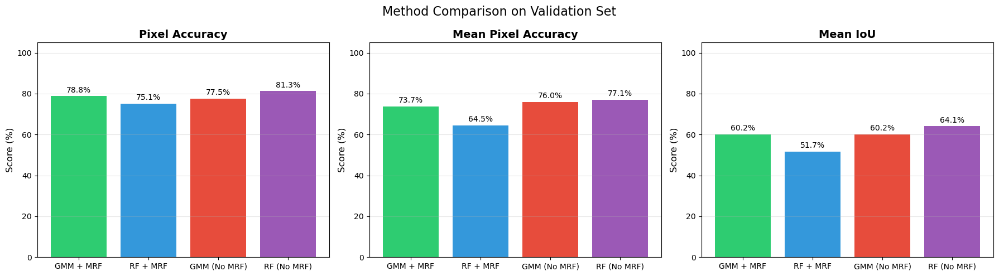

In [19]:
run_comparison_suite(val_img_paths, val_gt_paths, "Validation Set")

测试集


==================== Running Comparison on Test Set ====================

[Test Set] >>> GMM + MRF
Full evaluation: GMM + MRF


Eval GMM: 100%|██████████| 256/256 [02:53<00:00,  1.48it/s]


  Calculating metrics for 17,812,160 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           74.17%
Mean Pixel Accuracy (MPA):     69.94%
Mean IoU (mIoU):               54.43%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              68.78%       79.92%
Man-made             40.08%       59.96%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          7,427,782       1,865,834
True Man-made         1,505,710       2,255,204

[Test Set] >>> Random Forest + MRF
Full evaluation: Random Forest + MRF


Eval Random Forest: 100%|██████████| 256/256 [03:40<00:00,  1.16it/s]


  Calculating metrics for 17,812,160 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           76.14%
Mean Pixel Accuracy (MPA):     66.26%
Mean IoU (mIoU):               53.46%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              72.77%       89.57%
Man-made             34.15%       42.95%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          8,324,295         969,321
True Man-made         2,145,616       1,615,298

[Test Set] >>> GMM (No MRF)
Full evaluation: GMM 


Eval GMM: 100%|██████████| 256/256 [01:11<00:00,  3.60it/s]


  Calculating metrics for 17,812,160 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           73.11%
Mean Pixel Accuracy (MPA):     72.14%
Mean IoU (mIoU):               54.57%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              66.33%       74.43%
Man-made             42.80%       69.85%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          6,916,954       2,376,662
True Man-made         1,133,907       2,627,007

[Test Set] >>> Random Forest (No MRF)
Full evaluation: Random Forest 


Eval Random Forest: 100%|██████████| 256/256 [01:42<00:00,  2.51it/s]


  Calculating metrics for 17,812,160 pixels...
Summary of evaluation indicators

Pixel Accuracy (PA):           79.45%
Mean Pixel Accuracy (MPA):     74.84%
Mean IoU (mIoU):               61.04%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              74.80%       85.70%
Man-made             47.28%       63.99%

Confusion Matrix:
                   Pred Natural   Pred Man-made
True Natural          7,964,687       1,328,929
True Man-made         1,354,384       2,406,530

SUMMARY: Test Set
Method               PA         MPA        mIoU      
------------------------------------------------------------
GMM + MRF               74.17%      69.94%      54.43%
RF + MRF                76.14%      66.26%      53.46%
GMM (No MRF)            73.11%      72.14%      54.57%
RF (No MRF)             79.45%      74.84%      61.04%
------------------------------------------------------------


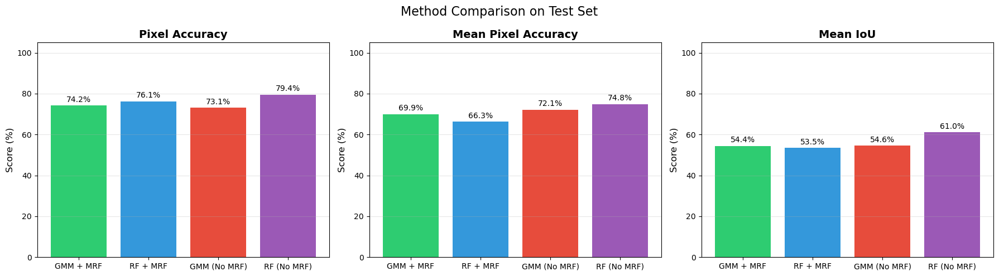

In [20]:
run_comparison_suite(test_img_paths, test_gt_paths, "Test Set")

## 2.4 传统方法效果展示与对比

## 2.3 传统方法效果测试

测试三种一元势能方法(RF, SVM, GMM)以及结合MRF的效果

Single Image Effect Display

Test Image: ./dataset\images\11_21_s.bmp
Image Size: (213, 320, 3)

Random Forest Effect:


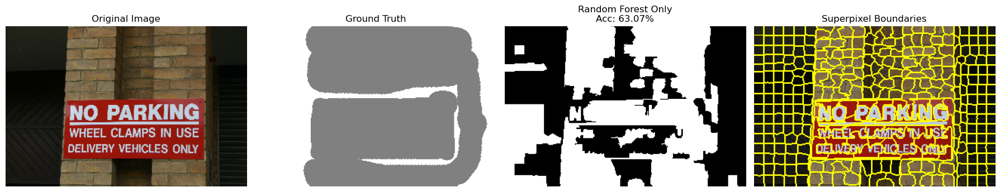


Random Forest + MRF Effect:


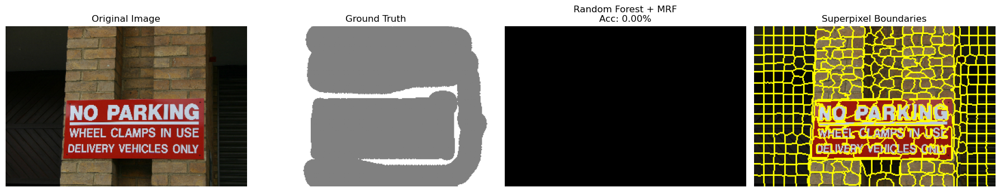


GMM Effect:


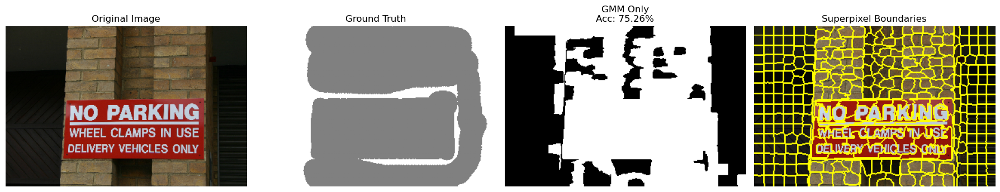


GMM + MRF Effect:


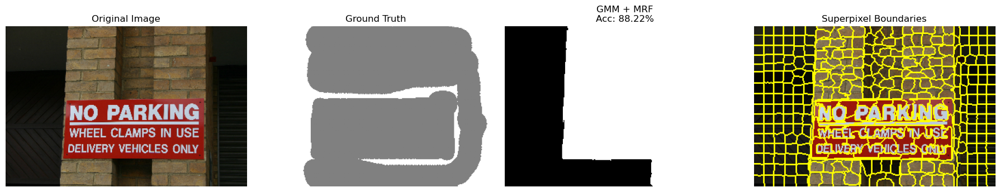

Accuracy comparison (single picture):
Random Forest:         63.07%
Random Forest + MRF:   0.00%  (Improvement: -63.07%)
GMM:                   75.26%
GMM + MRF:             88.22%  (Improvement: +12.96%)


In [21]:
# =====================================================
# 在验证集上测试单张图片效果
# =====================================================
print("Single Image Effect Display")

if len(val_img_paths) > 0:
    # 选择一张验证集图片
    test_idx = min(5, len(val_img_paths)-1)
    
    print(f"\nTest Image: {val_img_paths[test_idx]}")
    print(f"Image Size: {cv2.imread(val_img_paths[test_idx]).shape}")
    
    # 1. Random Forest
    print("\nRandom Forest Effect:")
    acc_rf = visualize_comparison(val_img_paths[test_idx], val_gt_paths[test_idx], 
                                   rf_clf, "Random Forest", use_mrf=False)
    
    # 2. Random Forest + MRF
    print("\nRandom Forest + MRF Effect:")
    acc_rf_mrf = visualize_comparison(val_img_paths[test_idx], val_gt_paths[test_idx], 
                                       rf_clf, "Random Forest", use_mrf=True)
    
    
    # 5. GMM
    print("\nGMM Effect:")
    acc_gmm = visualize_comparison(val_img_paths[test_idx], val_gt_paths[test_idx], 
                                    gmm_clf, "GMM", use_mrf=False)
    
    # 6. GMM + MRF
    print("\nGMM + MRF Effect:")
    acc_gmm_mrf = visualize_comparison(val_img_paths[test_idx], val_gt_paths[test_idx], 
                                        gmm_clf, "GMM", use_mrf=True)
    
    # 总结对比
    print("Accuracy comparison (single picture):")
    print(f"Random Forest:         {acc_rf*100:.2f}%")
    print(f"Random Forest + MRF:   {acc_rf_mrf*100:.2f}%  (Improvement: {(acc_rf_mrf-acc_rf)*100:+.2f}%)")
    print(f"GMM:                   {acc_gmm*100:.2f}%")
    print(f"GMM + MRF:             {acc_gmm_mrf*100:.2f}%  (Improvement: {(acc_gmm_mrf-acc_gmm)*100:+.2f}%)")

## 2.4 不同尺寸图片适配性测试

验证自适应超像素分割对不同尺寸图片的处理效果


Adaptability Analysis: Different Image Sizes
Grouping images by size...

Found 5 different sizes:
   213x320: 72 images
   240x320: 19 images
   320x213: 7 images
   239x320: 1 images
   320x240: 1 images

Visualizing superpixel segmentation on different sizes...


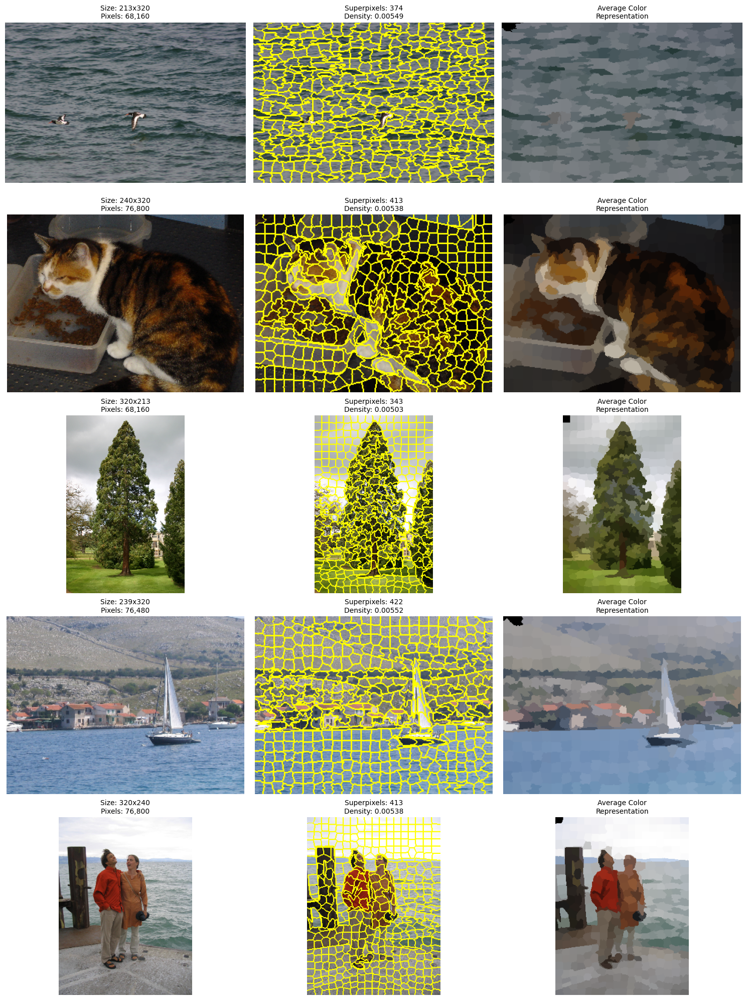


Running accuracy comparison for 4 methods across sizes...


Analyzing sizes: 100%|██████████| 5/5 [00:27<00:00,  5.56s/it]


ADAPTABILITY RESULTS (Accuracy by Image Size)
Size         Count    RF           GMM          RF+MRF       GMM+MRF     
---------------------------------------------------------------------------
213x320      72        85.08%       76.46%       92.03%       77.06%
240x320      19        71.10%       63.46%       83.95%       56.81%
320x213      7         84.86%       78.08%       82.22%       86.46%
239x320      1         68.01%       72.46%       41.63%       41.63%
320x240      1         80.65%       86.76%       47.31%       88.22%


In [23]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
from skimage.segmentation import mark_boundaries
from skimage.color import label2rgb

# =====================================================
# 按图片尺寸分组测试 (四种方法对比版)
# =====================================================
print(f"\n{'='*40}")
print(f"Adaptability Analysis: Different Image Sizes")
print(f"{'='*40}")

# 1. 收集所有图片尺寸并分组 (同时收集 GT 路径)
# -----------------------------------------------------
print("Grouping images by size...")
size_groups = {}

# 假设 test_img_paths 和 test_gt_paths 已经定义好
# 为了演示，只分析前 100 张 (或者全部)
analyze_limit = 100 
current_paths = list(zip(test_img_paths, test_gt_paths))[:analyze_limit]

for img_path, gt_path in current_paths:
    # 快速读取头部信息获取尺寸，避免解码全部像素 (优化速度)
    # 也可以直接 imread，数据量不大没关系
    img = cv2.imread(img_path)
    if img is None:
        continue
    h, w = img.shape[:2]
    size_key = f"{h}x{w}"
    
    if size_key not in size_groups:
        size_groups[size_key] = []
    size_groups[size_key].append((img_path, gt_path))

print(f"\nFound {len(size_groups)} different sizes:")
sorted_sizes = sorted(size_groups.items(), key=lambda x: len(x[1]), reverse=True)
for size_key, items in sorted_sizes:
    print(f"   {size_key}: {len(items)} images")

# 2. 可视化：每种尺寸挑一张展示超像素分割效果
# -----------------------------------------------------
print("\nVisualizing superpixel segmentation on different sizes...")

# 限制显示的尺寸组数量，避免图表过大 (最多显示前5种最常见的尺寸)
display_groups = sorted_sizes[:5]
n_groups = len(display_groups)

fig, axes = plt.subplots(n_groups, 3, figsize=(15, 4 * n_groups))
if n_groups == 1:
    axes = axes.reshape(1, -1)

for idx, (size_key, items) in enumerate(display_groups):
    img_path, _ = items[0]
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 自适应超像素分割
    _, segments = generate_superpixels_adaptive(img, target_density=0.006)
    
    # 1. 原图
    ax_orig = axes[idx, 0]
    ax_orig.imshow(img)
    ax_orig.set_title(f"Size: {size_key}\nPixels: {img.shape[0]*img.shape[1]:,}", fontsize=10)
    ax_orig.axis('off')
    
    # 2. 超像素边界
    ax_bound = axes[idx, 1]
    vis_boundaries = mark_boundaries(img, segments, color=(1, 1, 0))
    n_sp = len(np.unique(segments))
    ax_bound.imshow(vis_boundaries)
    ax_bound.set_title(f"Superpixels: {n_sp}\nDensity: {n_sp/(img.shape[0]*img.shape[1]):.5f}", fontsize=10)
    ax_bound.axis('off')
    
    # 3. 平均颜色 (抽象表示)
    ax_avg = axes[idx, 2]
    vis_avg = label2rgb(segments, image=img, kind='avg')
    ax_avg.imshow(vis_avg)
    ax_avg.set_title(f"Average Color\nRepresentation", fontsize=10)
    ax_avg.axis('off')

plt.tight_layout()
plt.show()

# 3. 准确率对比：四种方法 (RF, GMM, RF+MRF, GMM+MRF)
# -----------------------------------------------------
print("\nRunning accuracy comparison for 4 methods across sizes...")

# 存储结果: {size_key: {'RF': [], 'GMM': [], 'RF_MRF': [], 'GMM_MRF': []}}
size_metrics = {}

for size_key, items in tqdm(size_groups.items(), desc="Analyzing sizes"):
    # 为了节省时间，每种尺寸最多测试 5 张图片
    test_items = items[:min(5, len(items))]
    
    metrics = {'RF': [], 'GMM': [], 'RF_MRF': [], 'GMM_MRF': []}
    
    for img_path, gt_path in test_items:
        # 读取数据
        img = cv2.imread(img_path)
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        gt_img = cv2.imread(gt_path)
        if gt_img is None: continue
        gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
        
        mapping = get_msrc_mapping()
        gt_mask = mask_to_binary(gt_img, mapping)
        
        # 忽略 Void 区域
        valid_mask = (gt_mask != 255)
        if np.sum(valid_mask) == 0: continue

        # 超像素与特征提取
        _, segments = generate_superpixels_adaptive(img)
        features, _ = extract_features_and_labels(img, segments, None)
        
        if len(features) == 0: continue

        # --- 方法 1: RF (No MRF) ---
        pred_rf = rf_clf.predict(features)
        mask_rf = labels_to_mask(segments, pred_rf)
        acc_rf = accuracy_score(gt_mask[valid_mask], mask_rf[valid_mask])
        metrics['RF'].append(acc_rf)
        
        # --- 方法 2: GMM (No MRF) ---
        pred_gmm = gmm_clf.predict(features)
        mask_gmm = labels_to_mask(segments, pred_gmm)
        acc_gmm = accuracy_score(gt_mask[valid_mask], mask_gmm[valid_mask])
        metrics['GMM'].append(acc_gmm)
        
        # --- 方法 3: RF + MRF ---
        # 假设 perform_mrf_inference 可用
        try:
            pred_rf_mrf = perform_mrf_inference(img, segments, rf_clf, lambda_smooth=15, sigma=25)
            mask_rf_mrf = labels_to_mask(segments, pred_rf_mrf)
            acc_rf_mrf = accuracy_score(gt_mask[valid_mask], mask_rf_mrf[valid_mask])
            metrics['RF_MRF'].append(acc_rf_mrf)
        except Exception:
            metrics['RF_MRF'].append(0.0) # 标记失败

        # --- 方法 4: GMM + MRF ---
        try:
            pred_gmm_mrf = perform_mrf_inference(img, segments, gmm_clf, lambda_smooth=15, sigma=25)
            mask_gmm_mrf = labels_to_mask(segments, pred_gmm_mrf)
            acc_gmm_mrf = accuracy_score(gt_mask[valid_mask], mask_gmm_mrf[valid_mask])
            metrics['GMM_MRF'].append(acc_gmm_mrf)
        except Exception:
            metrics['GMM_MRF'].append(0.0)

    # 计算该尺寸下的平均准确率
    if len(metrics['RF']) > 0:
        size_metrics[size_key] = {
            'Count': len(items),
            'RF': np.mean(metrics['RF']),
            'GMM': np.mean(metrics['GMM']),
            'RF_MRF': np.mean(metrics['RF_MRF']),
            'GMM_MRF': np.mean(metrics['GMM_MRF'])
        }

# 4. 打印汇总表格
# -----------------------------------------------------
print(f"\n{'='*75}")
print(f"ADAPTABILITY RESULTS (Accuracy by Image Size)")
print(f"{'='*75}")
print(f"{'Size':<12} {'Count':<8} {'RF':<12} {'GMM':<12} {'RF+MRF':<12} {'GMM+MRF':<12}")
print(f"{'-'*75}")

# 按图片数量排序输出 (数量多的更有代表性)
sorted_results = sorted(size_metrics.items(), key=lambda x: x[1]['Count'], reverse=True)

for size_key, res in sorted_results:
    n = res['Count']
    rf = res['RF'] * 100
    gmm = res['GMM'] * 100
    rf_mrf = res['RF_MRF'] * 100
    gmm_mrf = res['GMM_MRF'] * 100
    
    # 高亮表现最好的
    best_val = max(rf, gmm, rf_mrf, gmm_mrf)
    
    print(f"{size_key:<12} {n:<8} {rf:>6.2f}%      {gmm:>6.2f}%      {rf_mrf:>6.2f}%      {gmm_mrf:>6.2f}%")

print(f"{'='*75}")

# 3. 深度学习方法：从U-Net到DeepLabV3 (Task 3)

本章节使用深度学习方法进行端到端的语义分割。

**核心思想：**
与传统方法不同，深度学习方法通过卷积神经网络直接学习从像素到类别的映射，无需手工设计特征。

**实现模型：**
1. **U-Net**: 经典的医学图像分割网络，采用编码器-解码器结构和跳跃连接
2. **DeepLabV3**: 先进的语义分割网络，使用空洞卷积和ASPP模块

**训练策略：**
- 数据增强（随机翻转、旋转、颜色抖动）
- 学习率调度（CosineAnnealing或ReduceLROnPlateau）
- 早停机制防止过拟合
- 使用加权交叉熵损失处理类别不平衡

**训练记录 (Task 5)：**
所有训练过程（loss、accuracy、mIoU等）将保存到JSON文件中以便后续分析和可视化。

## 3.1 数据集准备与数据增强

In [ ]:
IMG_SIZE = (320, 320)  # 统一图像大小

class MSRCDataset(Dataset):
    """
    MSRC v2 数据集的PyTorch Dataset类
    支持数据增强和Void区域处理
    """
    def __init__(self, img_paths, gt_paths, color_to_label, augment=False):
        self.img_paths = img_paths
        self.gt_paths = gt_paths
        self.color_to_label = color_to_label
        self.augment = augment  # 只在训练集开启增强
        
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        # 加载图像和Ground Truth
        image = Image.open(self.img_paths[idx]).convert('RGB')
        gt_img = Image.open(self.gt_paths[idx]).convert('RGB')
        
        # 1. 基础Resize (必须做)
        image = image.resize(IMG_SIZE, Image.BILINEAR)
        gt_img = gt_img.resize(IMG_SIZE, Image.NEAREST)  # GT使用最近邻插值
        
        # 2. 数据增强 (仅训练集)
        if self.augment:
            # 随机水平翻转
            if random.random() > 0.5:
                image = TF.hflip(image)
                gt_img = TF.hflip(gt_img)
            
            # 随机垂直翻转
            if random.random() > 0.5:
                image = TF.vflip(image)
                gt_img = TF.vflip(gt_img)
            
            # 随机旋转 (±15度)
            angle = random.uniform(-15, 15)
            image = TF.rotate(image, angle, interpolation=TF.InterpolationMode.BILINEAR)
            gt_img = TF.rotate(gt_img, angle, interpolation=TF.InterpolationMode.NEAREST)
            
            # 颜色抖动 (仅对image)
            if random.random() > 0.5:
                jitter = transforms.ColorJitter(brightness=0.2, contrast=0.2, 
                                               saturation=0.2, hue=0.1)
                image = jitter(image)
        
        # 3. 转换为tensor
        image = TF.to_tensor(image)  # [C, H, W], 值域 [0, 1]
        
        # 4. 标准化 (使用ImageNet均值和标准差)
        normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                        std=[0.229, 0.224, 0.225])
        image = normalize(image)
        
        # 5. GT转换为标签mask
        gt_array = np.array(gt_img)
        mask = np.zeros((gt_array.shape[0], gt_array.shape[1]), dtype=np.uint8)
        
        # 遍历所有颜色映射
        for color, label in self.color_to_label.items():
            match = np.all(gt_array == color, axis=-1)
            mask[match] = label
        
        # 将Void区域标记为255 (在loss计算时ignore_index=255)
        # 注意：black (0,0,0) 通常是Void
        void_mask = np.all(gt_array == (0, 0, 0), axis=-1)
        mask[void_mask] = 255
        
        mask = torch.from_numpy(mask).long()
        
        return image, mask


# 创建数据加载器
def create_dataloaders(batch_size=8, num_workers=0):
    """
    创建训练集、验证集和测试集的DataLoader
    """
    print("\n Ceate DataLoaders")

    color_to_label = get_msrc_mapping()
    
    train_dataset = MSRCDataset(train_img_paths, train_gt_paths, color_to_label, augment=True)
    val_dataset = MSRCDataset(val_img_paths, val_gt_paths, color_to_label, augment=False)
    test_dataset = MSRCDataset(test_img_paths, test_gt_paths, color_to_label, augment=False)
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, 
                             num_workers=num_workers, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, 
                           num_workers=num_workers, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, 
                            num_workers=num_workers, pin_memory=True)
    
    print(f"Training set: {len(train_dataset)} images, {len(train_loader)} batches")
    print(f"Validation set: {len(val_dataset)} images, {len(val_loader)} batches")
    print(f"Testing set: {len(test_dataset)} images, {len(test_loader)} batches")
    
    return train_loader, val_loader, test_loader

## 3.2 U-Net模型实现

In [25]:
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        # --- Encoder (Downsampling) ---
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = DoubleConv(64, 128)
        self.down2 = DoubleConv(128, 256)
        self.down3 = DoubleConv(256, 512)
        self.down4 = DoubleConv(512, 1024)
        
        self.pool = nn.MaxPool2d(2)

        # --- Decoder (Upsampling) ---
        self.up1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.conv1 = DoubleConv(1024, 512) # 512 from up + 512 from skip
        
        self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv2 = DoubleConv(512, 256)
        
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv3 = DoubleConv(256, 128)
        
        self.up4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv4 = DoubleConv(128, 64)
        
        # Output layer
        self.outc = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        # Encoding
        x1 = self.inc(x)
        x2 = self.down1(self.pool(x1))
        x3 = self.down2(self.pool(x2))
        x4 = self.down3(self.pool(x3))
        x5 = self.down4(self.pool(x4)) # Bottom

        # Decoding (with Skip Connections)
        x = self.up1(x5)
        # Skip connection x4 needs to be concatenated
        # Note: if input size is not perfectly divisible by 2^4, resize might be needed here.
        # But since we resized to 256x256, it aligns perfectly.
        x = torch.cat([x4, x], dim=1)
        x = self.conv1(x)

        x = self.up2(x)
        x = torch.cat([x3, x], dim=1)
        x = self.conv2(x)

        x = self.up3(x)
        x = torch.cat([x2, x], dim=1)
        x = self.conv3(x)
        
        x = self.up4(x)
        x = torch.cat([x1, x], dim=1)
        x = self.conv4(x)

        logits = self.outc(x)
        return logits

## 3.3 DeepLabV3模型实现

In [26]:
from torchvision import models
import torch.nn as nn

class PretrainedDeepLab(nn.Module):
    def __init__(self, num_classes=2):
        super(PretrainedDeepLab, self).__init__()
        # 1. 加载官方预训练的 DeepLabV3 (Backbone: ResNet50)
        # weights='DEFAULT' 会自动下载 ImageNet 的预训练权重
        self.model = models.segmentation.deeplabv3_resnet50(weights='DEFAULT')
        
        # 2. 修改分类头 (Classifier Head)
        # 原始模型的分类头是针对 COCO 数据集 (21类) 的，我们需要改成 num_classes (2类)
        #DeepLabV3 的分类器结构: model.classifier[4] 是最后一层 Conv2d
        old_classifier = self.model.classifier[4]
        self.model.classifier[4] = nn.Conv2d(
            in_channels=old_classifier.in_channels, 
            out_channels=num_classes, 
            kernel_size=1, 
            stride=1
        )
        
        # 3. 如果想让训练更快，可以冻结 Backbone 的前几层 (可选，这里暂时不冻结，让它微调)
        
    def forward(self, x):
        # torchvision 的分割模型输出是一个字典: {'out': tensor, 'aux': tensor}
        # 我们只需要 'out'
        return self.model(x)['out']

## 3.4 训练循环与JSON日志记录 (Task 5)

In [27]:
# =====================================================
# 训练函数 - 支持JSON日志记录
# =====================================================

def train_one_epoch(model, loader, criterion, optimizer, device, epoch_idx, num_epochs):
    """单个epoch的训练"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch_idx}/{num_epochs} [Train]", leave=False)
    
    for images, masks in loop:
        images = images.to(device)
        masks = masks.to(device)
        
        # 前向传播
        outputs = model(images)
        loss = criterion(outputs, masks)
        
        # 反向传播
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # 计算准确率 (忽略Void区域)
        preds = torch.argmax(outputs, dim=1)
        valid_mask = (masks != 255)
        correct += ((preds == masks) & valid_mask).sum().item()
        total += valid_mask.sum().item()
        
        # 更新进度条
        loop.set_postfix(loss=loss.item(), acc=correct/total if total > 0 else 0)
    
    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total if total > 0 else 0
    
    return epoch_loss, epoch_acc


def validate(model, loader, criterion, device, epoch_idx, num_epochs):
    """验证集评估"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch_idx}/{num_epochs} [Val]", leave=False)
    
    with torch.no_grad():
        for images, masks in loop:
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, masks)
            
            running_loss += loss.item()
            
            # 计算准确率
            preds = torch.argmax(outputs, dim=1)
            valid_mask = (masks != 255)
            correct += ((preds == masks) & valid_mask).sum().item()
            total += valid_mask.sum().item()
            
            loop.set_postfix(loss=loss.item(), acc=correct/total if total > 0 else 0)
    
    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total if total > 0 else 0
    
    return epoch_loss, epoch_acc


def train_model_with_logging(model, train_loader, val_loader, num_epochs, 
                             model_name="model", device='cuda', learning_rate=1e-4):
    """
    完整的训练流程，包含JSON日志记录
    
    参数:
        model: PyTorch模型
        train_loader: 训练数据加载器
        val_loader: 验证数据加载器
        num_epochs: 训练轮数
        model_name: 模型名称（用于保存）
        device: 设备
        learning_rate: 学习率
    
    返回:
        history: 训练历史记录
    """
    print(f"\nStart training {model_name}...")
    print(f"Device: {device}")
    print(f"Learning Rate: {learning_rate}")
    print(f"Number of epochs: {num_epochs}")
    
    model = model.to(device)
    
    # 损失函数 - 使用加权交叉熵，忽略Void区域
    criterion = nn.CrossEntropyLoss(ignore_index=255)
    
    # 优化器
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # 学习率调度器
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', 
                                                     factor=0.5, patience=3)
    
    # 训练历史记录
    history = {
        'model_name': model_name,
        'num_epochs': num_epochs,
        'learning_rate': learning_rate,
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': [],
        'learning_rates': [],
        'best_epoch': 0,
        'best_val_loss': float('inf')
    }
    
    # Early stopping
    patience = 10
    patience_counter = 0
    best_val_loss = float('inf')
    
    # Training loop
    for epoch in range(1, num_epochs + 1):
        # 训练
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, 
                                                optimizer, device, epoch, num_epochs)
        
        # 验证
        val_loss, val_acc = validate(model, val_loader, criterion, device, epoch, num_epochs)
        
        # 学习率调度
        scheduler.step(val_loss)
        current_lr = optimizer.param_groups[0]['lr']
        
        # 记录历史
        history['train_loss'].append(float(train_loss))
        history['train_acc'].append(float(train_acc))
        history['val_loss'].append(float(val_loss))
        history['val_acc'].append(float(val_acc))
        history['learning_rates'].append(float(current_lr))
        
        # 打印信息
        print(f"Epoch {epoch}/{num_epochs} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f} | "
              f"LR: {current_lr:.6f}")
        
        # 保存最佳模型
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            history['best_epoch'] = epoch
            history['best_val_loss'] = float(best_val_loss)
            torch.save(model.state_dict(), f'./tmp/{model_name}_best.pth')
            print(f"--- Saved best model (Val Loss: {best_val_loss:.4f})")
            patience_counter = 0
        else:
            patience_counter += 1
        
        # Early stopping check
        if patience_counter >= patience:
            print(f"\nEarly stopping triggered (patience={patience})")
            break
    
    # 保存训练历史到JSON
    json_path = f'./tmp/{model_name}_training_history.json'
    with open(json_path, 'w') as f:
        json.dump(history, f, indent=2)
    print(f"\n Training history saved to: {json_path}")
    
    # 可视化训练曲线
    visualize_training_history(history)
    
    return history


def visualize_training_history(history):
    """可视化训练历史"""
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    epochs = range(1, len(history['train_loss']) + 1)
    
    # Loss曲线
    axes[0].plot(epochs, history['train_loss'], 'b-', label='Train Loss', linewidth=2)
    axes[0].plot(epochs, history['val_loss'], 'r-', label='Val Loss', linewidth=2)
    axes[0].axvline(x=history['best_epoch'], color='g', linestyle='--', 
                   label=f'Best Epoch ({history["best_epoch"]})')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title(f'{history["model_name"]} - Training Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Accuracy曲线
    axes[1].plot(epochs, history['train_acc'], 'b-', label='Train Acc', linewidth=2)
    axes[1].plot(epochs, history['val_acc'], 'r-', label='Val Acc', linewidth=2)
    axes[1].axvline(x=history['best_epoch'], color='g', linestyle='--', 
                   label=f'Best Epoch ({history["best_epoch"]})')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].set_title(f'{history["model_name"]} - Training Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    # Learning Rate曲线
    axes[2].plot(epochs, history['learning_rates'], 'g-', linewidth=2)
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Learning Rate')
    axes[2].set_title(f'{history["model_name"]} - Learning Rate Schedule')
    axes[2].set_yscale('log')
    axes[2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

## 3.5 深度学习模型评估

In [28]:
# =====================================================
# 深度学习评估函数 (使用完整指标)
# =====================================================
def evaluate_dl_model_with_metrics(model, img_paths, gt_paths, method_name="DL Model", 
                                    max_samples=None, device='cuda', visualize=True):
    """
    评估深度学习模型,使用完整的4个指标
    
    参数:
        model: PyTorch模型 (需要实现forward方法)
        img_paths: 图像路径列表
        gt_paths: GT路径列表
        method_name: 方法名称
        max_samples: 最大样本数
        device: 设备 ('cuda' 或 'cpu')
        visualize: 是否可视化混淆矩阵
    
    返回:
        metrics: 包含所有指标的字典
    """
    import torch
    import torch.nn.functional as F
    from torchvision import transforms
    
    if max_samples is not None:
        img_paths = img_paths[:max_samples]
        gt_paths = gt_paths[:max_samples]
    
    model.eval()
    model = model.to(device)
    
    # 收集所有预测和GT
    all_gt = []
    all_pred = []
    
    print(f"\nDeep Learning Model Evaluation: {method_name}")
    print(f"\nProcessing {len(img_paths)} images...")
    
    # 图像预处理
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((256, 256)),  # 根据模型调整
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    with torch.no_grad():
        for i, (img_p, gt_p) in enumerate(zip(img_paths, gt_paths)):
            # 读取图像
            img = cv2.imread(img_p)
            if img is None:
                continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            original_size = img.shape[:2]
            
            # 读取GT
            gt_img = cv2.imread(gt_p)
            gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
            mapping = get_msrc_mapping()
            gt_mask = mask_to_binary(gt_img, mapping)
            
            # 预处理图像
            img_tensor = transform(img).unsqueeze(0).to(device)
            
            # 预测
            output = model(img_tensor)
            
            # 处理输出 (根据模型结构调整)
            if isinstance(output, dict):  # DeepLab等模型
                output = output['out']
            
            pred = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
            
            # 调整回原始尺寸
            pred = cv2.resize(pred.astype(np.uint8), 
                            (original_size[1], original_size[0]), 
                            interpolation=cv2.INTER_NEAREST)
            
            # 收集结果
            all_gt.append(gt_mask.flatten())
            all_pred.append(pred.flatten())
            
            if (i+1) % 10 == 0:
                print(f"   Progress: {i+1}/{len(img_paths)}")
    
    # 合并所有像素
    y_true = np.concatenate(all_gt)
    y_pred = np.concatenate(all_pred)
    
    # 计算所有指标
    print("\nCalculating evaluation metrics:")
    metrics = compute_all_metrics(y_true, y_pred, num_classes=2, ignore_label=255)
    
    # 打印结果
    print_metrics(metrics, class_names=['Natural', 'Man-made'])
    
    # 可视化混淆矩阵
    if visualize:
        print("\nVisualizing the confusion matrix:")
        visualize_confusion_matrix(metrics['confusion_matrix'], 
                                  class_names=['Natural', 'Man-made'], 
                                  normalize=False)
        visualize_confusion_matrix(metrics['confusion_matrix'], 
                                  class_names=['Natural', 'Man-made'], 
                                  normalize=True)
    
    return metrics

## 3.6 模型训练

Device: cuda

 Ceate DataLoaders
Training set: 276 images, 35 batches
Validation set: 59 images, 8 batches
Testing set: 256 images, 32 batches

Initialize UNet model
Model parameters: 31.04M

Start training UNet...
Device: cuda
Learning Rate: 0.0001
Number of epochs: 30


Epoch 1/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.5906, Train Acc: 0.6849 | Val Loss: 0.5351, Val Acc: 0.7615 | LR: 0.000100
--- Saved best model (Val Loss: 0.5351)


Epoch 2/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.5489, Train Acc: 0.6974 | Val Loss: 0.4877, Val Acc: 0.7625 | LR: 0.000100
--- Saved best model (Val Loss: 0.4877)


Epoch 3/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.5247, Train Acc: 0.7258 | Val Loss: 0.5370, Val Acc: 0.7521 | LR: 0.000100


Epoch 4/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.5197, Train Acc: 0.7135 | Val Loss: 0.4656, Val Acc: 0.7455 | LR: 0.000100
--- Saved best model (Val Loss: 0.4656)


Epoch 5/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.5053, Train Acc: 0.7330 | Val Loss: 0.4506, Val Acc: 0.7800 | LR: 0.000100
--- Saved best model (Val Loss: 0.4506)


Epoch 6/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.5032, Train Acc: 0.7340 | Val Loss: 0.4522, Val Acc: 0.7710 | LR: 0.000100


Epoch 7/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.4854, Train Acc: 0.7511 | Val Loss: 0.4592, Val Acc: 0.7777 | LR: 0.000100


Epoch 8/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.4862, Train Acc: 0.7482 | Val Loss: 0.4561, Val Acc: 0.7898 | LR: 0.000100


Epoch 9/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.4762, Train Acc: 0.7629 | Val Loss: 0.4592, Val Acc: 0.7888 | LR: 0.000050


Epoch 10/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.4721, Train Acc: 0.7729 | Val Loss: 0.4377, Val Acc: 0.7996 | LR: 0.000050
--- Saved best model (Val Loss: 0.4377)


Epoch 11/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.4566, Train Acc: 0.7818 | Val Loss: 0.4632, Val Acc: 0.7642 | LR: 0.000050


Epoch 12/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.4403, Train Acc: 0.7867 | Val Loss: 0.4466, Val Acc: 0.7839 | LR: 0.000050


Epoch 13/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.4412, Train Acc: 0.7892 | Val Loss: 0.4428, Val Acc: 0.7911 | LR: 0.000050


Epoch 14/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.4405, Train Acc: 0.7996 | Val Loss: 0.4807, Val Acc: 0.7914 | LR: 0.000025


Epoch 15/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.4575, Train Acc: 0.7798 | Val Loss: 0.4363, Val Acc: 0.8004 | LR: 0.000025
--- Saved best model (Val Loss: 0.4363)


Epoch 16/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 16/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.4331, Train Acc: 0.7999 | Val Loss: 0.4359, Val Acc: 0.8030 | LR: 0.000025
--- Saved best model (Val Loss: 0.4359)


Epoch 17/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 17/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.4238, Train Acc: 0.8038 | Val Loss: 0.4746, Val Acc: 0.7938 | LR: 0.000025


Epoch 18/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 18/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.4062, Train Acc: 0.8152 | Val Loss: 0.4374, Val Acc: 0.8043 | LR: 0.000025


Epoch 19/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 19/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.4007, Train Acc: 0.8161 | Val Loss: 0.4438, Val Acc: 0.7971 | LR: 0.000025


Epoch 20/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 20/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.4206, Train Acc: 0.8013 | Val Loss: 0.4514, Val Acc: 0.8127 | LR: 0.000013


Epoch 21/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 21/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.3954, Train Acc: 0.8260 | Val Loss: 0.4402, Val Acc: 0.8107 | LR: 0.000013


Epoch 22/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 22/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.3930, Train Acc: 0.8286 | Val Loss: 0.4454, Val Acc: 0.8073 | LR: 0.000013


Epoch 23/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 23/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.3971, Train Acc: 0.8287 | Val Loss: 0.4454, Val Acc: 0.8059 | LR: 0.000013


Epoch 24/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 24/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.3885, Train Acc: 0.8266 | Val Loss: 0.4519, Val Acc: 0.8047 | LR: 0.000006


Epoch 25/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 25/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.3791, Train Acc: 0.8346 | Val Loss: 0.4625, Val Acc: 0.8016 | LR: 0.000006


Epoch 26/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 26/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.3918, Train Acc: 0.8241 | Val Loss: 0.4531, Val Acc: 0.8030 | LR: 0.000006

Early stopping triggered (patience=10)

 Training history saved to: ./tmp/UNet_training_history.json


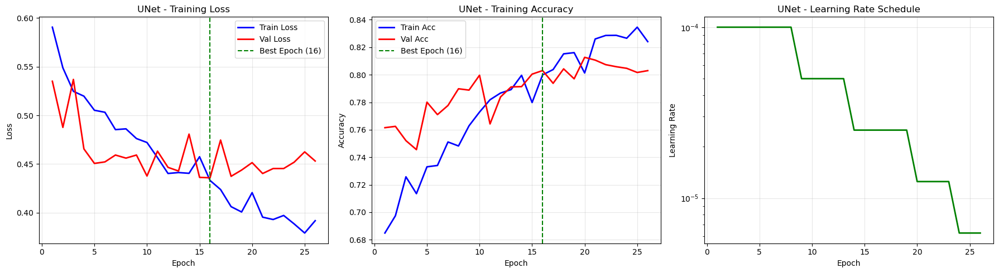

In [ ]:
# =====================================================
# 训练U-Net
# =====================================================

# 设置设备
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# 创建数据加载器
train_loader, val_loader, test_loader = create_dataloaders(batch_size=8, num_workers=0)
num_classes = 2  # 自然 vs 人造
# 初始化U-Net模型
print("\nInitialize UNet model")
unet_model = UNet(n_channels=3, n_classes=num_classes)
print(f"Model parameters: {sum(p.numel() for p in unet_model.parameters())/1e6:.2f}M")

# 训练U-Net
unet_history = train_model_with_logging(
    model=unet_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=30,
    model_name="UNet",
    device=device,
    learning_rate=1e-4
)

Device: cuda

Initialize DeepLabV3 model

 Ceate DataLoaders
Training set: 276 images, 35 batches
Validation set: 59 images, 8 batches
Testing set: 256 images, 32 batches
Model parameters: 42.00M

Start training DeepLabV3...
Device: cuda
Learning Rate: 0.0001
Number of epochs: 30


Epoch 1/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 1/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.4924, Train Acc: 0.7674 | Val Loss: 0.4327, Val Acc: 0.8397 | LR: 0.000100
--- Saved best model (Val Loss: 0.4327)


Epoch 2/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 2/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.2548, Train Acc: 0.9146 | Val Loss: 0.2017, Val Acc: 0.9301 | LR: 0.000100
--- Saved best model (Val Loss: 0.2017)


Epoch 3/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 3/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.2457, Train Acc: 0.9070 | Val Loss: 0.1990, Val Acc: 0.9301 | LR: 0.000100
--- Saved best model (Val Loss: 0.1990)


Epoch 4/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 4/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.2244, Train Acc: 0.9157 | Val Loss: 0.1947, Val Acc: 0.9302 | LR: 0.000100
--- Saved best model (Val Loss: 0.1947)


Epoch 5/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 5/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.1883, Train Acc: 0.9319 | Val Loss: 0.2117, Val Acc: 0.9299 | LR: 0.000100


Epoch 6/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 6/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.1557, Train Acc: 0.9489 | Val Loss: 0.1728, Val Acc: 0.9420 | LR: 0.000100
--- Saved best model (Val Loss: 0.1728)


Epoch 7/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 7/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.1280, Train Acc: 0.9582 | Val Loss: 0.2169, Val Acc: 0.9234 | LR: 0.000100


Epoch 8/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 8/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.1642, Train Acc: 0.9444 | Val Loss: 0.1710, Val Acc: 0.9367 | LR: 0.000100
--- Saved best model (Val Loss: 0.1710)


Epoch 9/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 9/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.1228, Train Acc: 0.9565 | Val Loss: 0.2005, Val Acc: 0.9318 | LR: 0.000100


Epoch 10/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 10/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.1357, Train Acc: 0.9520 | Val Loss: 0.1475, Val Acc: 0.9491 | LR: 0.000100
--- Saved best model (Val Loss: 0.1475)


Epoch 11/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 11/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.1132, Train Acc: 0.9637 | Val Loss: 0.1597, Val Acc: 0.9553 | LR: 0.000100


Epoch 12/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 12/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.1158, Train Acc: 0.9621 | Val Loss: 0.2114, Val Acc: 0.9301 | LR: 0.000100


Epoch 13/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 13/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.1039, Train Acc: 0.9651 | Val Loss: 0.2284, Val Acc: 0.9335 | LR: 0.000100


Epoch 14/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 14/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.1109, Train Acc: 0.9625 | Val Loss: 0.1706, Val Acc: 0.9374 | LR: 0.000050


Epoch 15/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 15/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.0801, Train Acc: 0.9757 | Val Loss: 0.1496, Val Acc: 0.9405 | LR: 0.000050


Epoch 16/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 16/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.0638, Train Acc: 0.9801 | Val Loss: 0.1192, Val Acc: 0.9554 | LR: 0.000050
--- Saved best model (Val Loss: 0.1192)


Epoch 17/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 17/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.0634, Train Acc: 0.9801 | Val Loss: 0.1118, Val Acc: 0.9561 | LR: 0.000050
--- Saved best model (Val Loss: 0.1118)


Epoch 18/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 18/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.0730, Train Acc: 0.9784 | Val Loss: 0.1581, Val Acc: 0.9401 | LR: 0.000050


Epoch 19/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 19/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.0622, Train Acc: 0.9798 | Val Loss: 0.1727, Val Acc: 0.9379 | LR: 0.000050


Epoch 20/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 20/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.0439, Train Acc: 0.9883 | Val Loss: 0.1282, Val Acc: 0.9500 | LR: 0.000050


Epoch 21/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 21/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.0457, Train Acc: 0.9874 | Val Loss: 0.1758, Val Acc: 0.9418 | LR: 0.000025


Epoch 22/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 22/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.0459, Train Acc: 0.9862 | Val Loss: 0.1812, Val Acc: 0.9403 | LR: 0.000025


Epoch 23/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 23/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.0483, Train Acc: 0.9865 | Val Loss: 0.1555, Val Acc: 0.9458 | LR: 0.000025


Epoch 24/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 24/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.0370, Train Acc: 0.9899 | Val Loss: 0.1655, Val Acc: 0.9459 | LR: 0.000025


Epoch 25/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 25/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.0815, Train Acc: 0.9826 | Val Loss: 0.1620, Val Acc: 0.9480 | LR: 0.000013


Epoch 26/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 26/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.0401, Train Acc: 0.9892 | Val Loss: 0.1257, Val Acc: 0.9565 | LR: 0.000013


Epoch 27/30 [Train]:   0%|          | 0/35 [00:00<?, ?it/s]

Epoch 27/30 [Val]:   0%|          | 0/8 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.0372, Train Acc: 0.9894 | Val Loss: 0.1243, Val Acc: 0.9573 | LR: 0.000013

Early stopping triggered (patience=10)

 Training history saved to: ./tmp/DeepLabV3_training_history.json


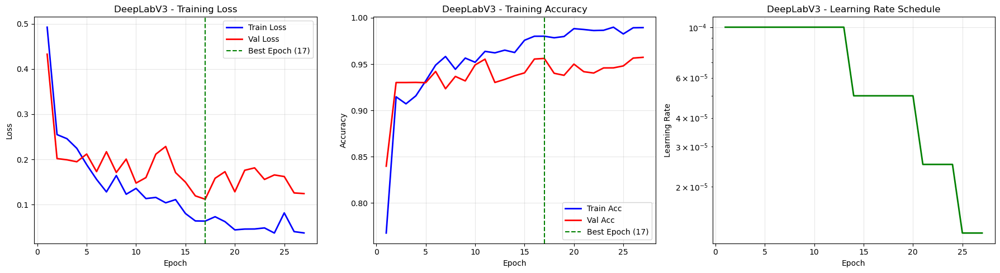

In [ ]:
# =====================================================
# 训练DeepLabV3
# =====================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
# 初始化DeepLabV3模型
print("\nInitialize DeepLabV3 model")
num_classes = 2  # 自然 vs 人造
train_loader, val_loader, test_loader = create_dataloaders(batch_size=8, num_workers=0)
deeplab_model = PretrainedDeepLab(num_classes=num_classes)
print(f"Model parameters: {sum(p.numel() for p in deeplab_model.parameters())/1e6:.2f}M")

# 训练DeepLabV3
deeplab_history = train_model_with_logging(
    model=deeplab_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=30,
    model_name="DeepLabV3",
    device=device,
    learning_rate=1e-4
)

## 3.7 深度学习模型效果对比


Deep Learning Model Test Set Evaluation

1. Evaluate U-Net...

Deep Learning Model Evaluation: U-Net

Processing 256 images...
   Progress: 10/256
   Progress: 20/256
   Progress: 30/256
   Progress: 40/256
   Progress: 50/256
   Progress: 60/256
   Progress: 70/256
   Progress: 80/256
   Progress: 90/256
   Progress: 100/256
   Progress: 110/256
   Progress: 120/256
   Progress: 130/256
   Progress: 140/256
   Progress: 150/256
   Progress: 160/256
   Progress: 170/256
   Progress: 180/256
   Progress: 190/256
   Progress: 200/256
   Progress: 210/256
   Progress: 220/256
   Progress: 230/256
   Progress: 240/256
   Progress: 250/256

Calculating evaluation metrics:
Summary of evaluation indicators

Pixel Accuracy (PA):           79.75%
Mean Pixel Accuracy (MPA):     74.21%
Mean IoU (mIoU):               60.97%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              75.42%       87.27%
Man-made             46.52%       61.16%

Confusion Matrix

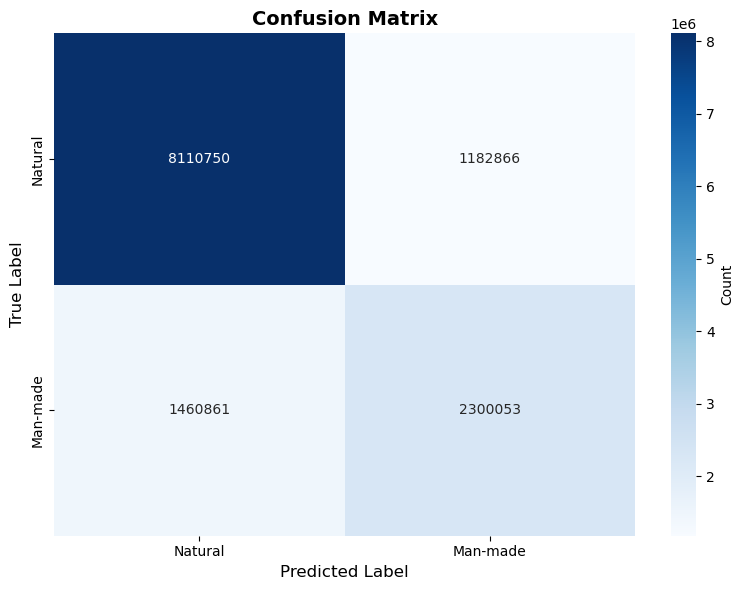

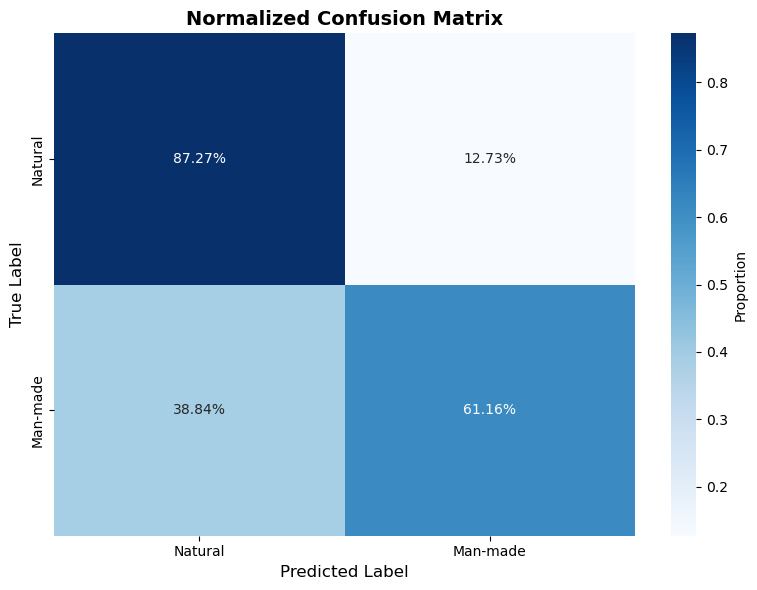


2. Evaluate DeepLabV3...

Deep Learning Model Evaluation: DeepLabV3

Processing 256 images...
   Progress: 10/256
   Progress: 20/256
   Progress: 30/256
   Progress: 40/256
   Progress: 50/256
   Progress: 60/256
   Progress: 70/256
   Progress: 80/256
   Progress: 90/256
   Progress: 100/256
   Progress: 110/256
   Progress: 120/256
   Progress: 130/256
   Progress: 140/256
   Progress: 150/256
   Progress: 160/256
   Progress: 170/256
   Progress: 180/256
   Progress: 190/256
   Progress: 200/256
   Progress: 210/256
   Progress: 220/256
   Progress: 230/256
   Progress: 240/256
   Progress: 250/256

Calculating evaluation metrics:
Summary of evaluation indicators

Pixel Accuracy (PA):           96.62%
Mean Pixel Accuracy (MPA):     95.54%
Mean IoU (mIoU):               92.09%

Detailed metrics for each class:
Class           IoU          Accuracy    
Natural              95.38%       98.08%
Man-made             88.80%       93.01%

Confusion Matrix:
                   Pred Natural

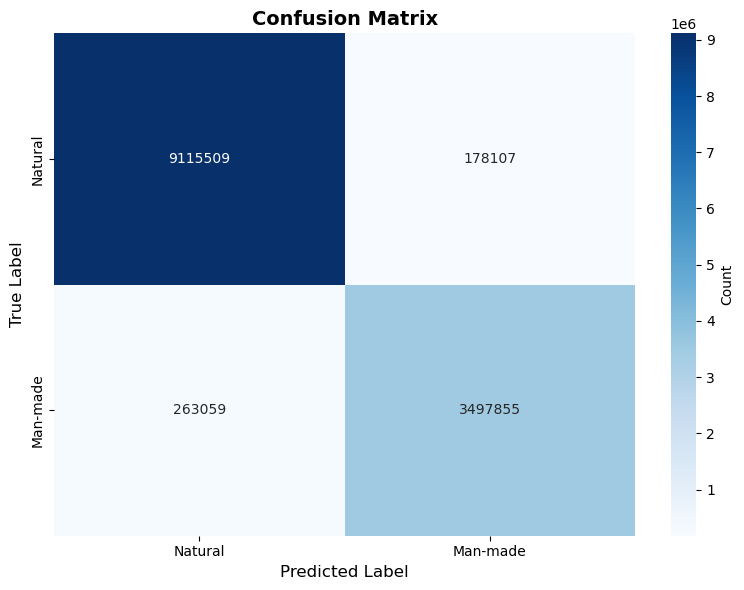

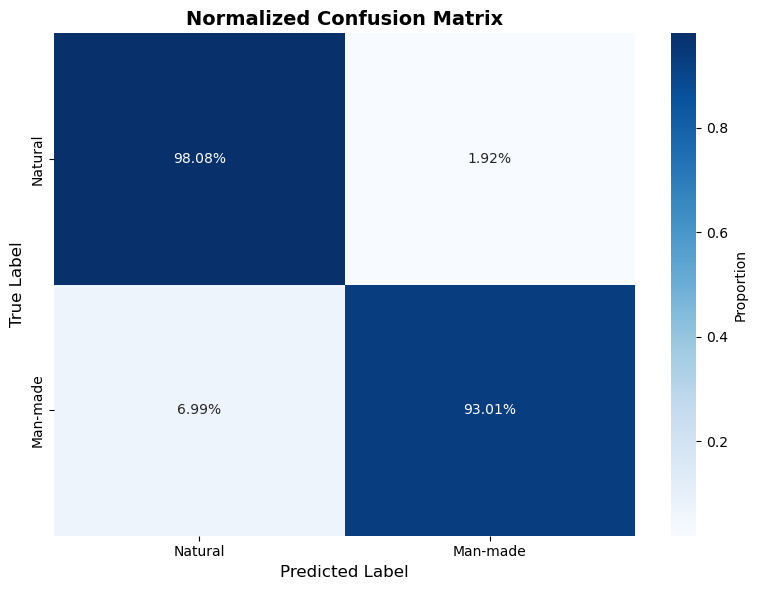

In [ ]:
# =====================================================
# 在测试集上评估深度学习模型
# =====================================================

print("\nDeep Learning Model Test Set Evaluation")

unet_model = UNet(n_channels=3, n_classes=num_classes)
deeplab_model = PretrainedDeepLab(num_classes=num_classes)
# 加载最佳模型
unet_model.load_state_dict(torch.load('./tmp/UNet_best.pth'))
deeplab_model.load_state_dict(torch.load('./tmp/DeepLabV3_best.pth'))
max_samples = len(test_img_paths)  # 使用全部测试样本
# 评估U-Net
print("\n1. Evaluate U-Net...")
unet_metrics = evaluate_dl_model_with_metrics(
    unet_model, test_img_paths, test_gt_paths,
    method_name="U-Net", max_samples=max_samples, device=device, visualize=True
)

# 评估DeepLabV3
print("\n2. Evaluate DeepLabV3...")
deeplab_metrics = evaluate_dl_model_with_metrics(
    deeplab_model, test_img_paths, test_gt_paths,
    method_name="DeepLabV3", max_samples=max_samples, device=device, visualize=True
)

In [ ]:
# 结果对比
print("Deep Learning Model Comparison Summary")
print(f"\n{'Model':<15} {'mIoU':>10} {'PA':>10} {'MPA':>10}")

print(f"{'U-Net':<15} {unet_metrics['miou']:>10.4f} {unet_metrics['pixel_accuracy']:>10.4f} {unet_metrics['mean_pixel_accuracy']:>10.4f}")
print(f"{'DeepLabV3':<15} {deeplab_metrics['miou']:>10.4f} {deeplab_metrics['pixel_accuracy']:>10.4f} {deeplab_metrics['mean_pixel_accuracy']:>10.4f}")

print("Available keys:", unet_metrics.keys())
print("Full dictionary:", unet_metrics)

print("Available keys:", deeplab_metrics.keys())
print("Full dictionary:", deeplab_metrics)

Deep Learning Model Comparison Summary

Model                 mIoU         PA        MPA
U-Net               0.6097     0.7975     0.7421
DeepLabV3           0.9209     0.9662     0.9554
Available keys: dict_keys(['confusion_matrix', 'miou', 'iou_per_class', 'pixel_accuracy', 'mean_pixel_accuracy', 'pa_per_class'])
Full dictionary: {'confusion_matrix': array([[8110750, 1182866],
       [1460861, 2300053]]), 'miou': np.float64(0.6097080316849559), 'iou_per_class': array([0.75417428, 0.46524178]), 'pixel_accuracy': np.float64(0.7974858535696038), 'mean_pixel_accuracy': np.float64(0.7421451491418776), 'pa_per_class': array([0.87272274, 0.61156756])}
Available keys: dict_keys(['confusion_matrix', 'miou', 'iou_per_class', 'pixel_accuracy', 'mean_pixel_accuracy', 'pa_per_class'])
Full dictionary: {'confusion_matrix': array([[9115509,  178107],
       [ 263059, 3497855]]), 'miou': np.float64(0.9209189890116601), 'iou_per_class': array([0.95383687, 0.8880011 ]), 'pixel_accuracy': np.float64(0.

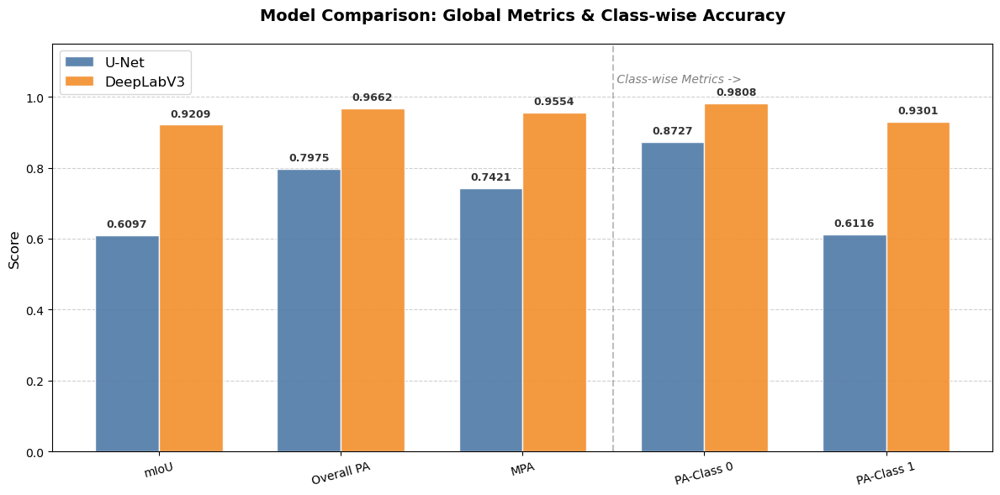

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# -------------------------------------------------------
# 1. 准备标签名称
# 如果你知道具体的类别名字（比如 'Background', 'Building'），请修改这里
class_names = ['Class 0', 'Class 1'] 
# -------------------------------------------------------

# 定义要提取的全局指标
global_metrics_config = [
    ('mIoU', 'miou'),
    ('Overall PA', 'pixel_accuracy'),
    ('MPA', 'mean_pixel_accuracy')
]

# --- 数据提取逻辑 ---
labels = []
unet_scores = []
deeplab_scores = []

# A. 先提取全局指标 (mIoU, PA, MPA)
for label, key in global_metrics_config:
    labels.append(label)
    unet_scores.append(unet_metrics.get(key, 0))
    deeplab_scores.append(deeplab_metrics.get(key, 0))

# B. 再提取每个类别的 PA (PA per class)
# 注意：我们需要确保数据存在且是数组格式
unet_pa_class = unet_metrics.get('pa_per_class', [])
deeplab_pa_class = deeplab_metrics.get('pa_per_class', [])

# 循环把每个类别的分数加进去
# 假设两个模型类别数量一致，以 unet 的长度为准
num_classes = len(unet_pa_class) 
for i in range(num_classes):
    # 如果你有自定义类别名就用，没有就用 'PA-Class 0' 这种格式
    c_name = class_names[i] if i < len(class_names) else f'Class {i}'
    labels.append(f'PA-{c_name}') 
    
    # 获取分数
    unet_scores.append(unet_pa_class[i])
    deeplab_scores.append(deeplab_pa_class[i])

# --- 绘图逻辑 (和之前类似) ---
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6)) # 稍微把图变宽一点，因为柱子变多了

rects1 = ax.bar(x - width/2, unet_scores, width, label='U-Net', color='#4E79A7', edgecolor='white', alpha=0.9)
rects2 = ax.bar(x + width/2, deeplab_scores, width, label='DeepLabV3', color='#F28E2B', edgecolor='white', alpha=0.9)

# 设置标签和标题
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Model Comparison: Global Metrics & Class-wise Accuracy', fontsize=14, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=10, rotation=15) # 稍微倾斜字体，防止标签重叠
ax.set_ylim(0, 1.15)
ax.legend(fontsize=12, loc='upper left')

# 自动标注数值
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 5),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=9, fontweight='bold', color='#333333')

autolabel(rects1)
autolabel(rects2)

# 添加分割线区分 "全局指标" 和 "分类指标"
# 在第3个柱子（MPA）和第4个柱子（Class 0）之间画一条虚线
ax.axvline(x=2.5, color='gray', linestyle='--', alpha=0.5)
ax.text(2.5, 1.05, ' Class-wise Metrics ->', ha='left', va='center', color='gray', fontsize=10, style='italic')

ax.set_axisbelow(True)
ax.yaxis.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()